<a href="https://colab.research.google.com/github/ImronRosada/Data_Science/blob/main/HW_Exploring_Clustering_Techniques_with_Python_(Unsepervised)_ImronRosada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMRON ROSADA<BR>
DATA SCIENCE<BR>
EXPLORING CLUSTERING TECHNIQUES WITH PYTHON

## share to arifromadhan19@gmail.com

In [ ]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

## `DATA UNDERSTANDING`

Mengeksplorasi data untuk mendapatkan wawasan awal serta memastikan kualitas data.

Perusahaan penerbangan tempat Anda bekerja ingin memahami pelanggan mereka dengan lebih baik. Sebagai seorang Data Scientist, tugas Anda adalah melakukan segmentasi pelanggan menggunakan metode K-Means Clustering. Dengan hasil segmentasi ini, perusahaan dapat mengelompokkan pelanggan berdasarkan pola dan karakteristik tertentu, lalu memberikan rekomendasi atau perlakuan (treatment) yang sesuai untuk setiap kelompok.

### **Deskripsi Variabel**  
Deskripsi Variabel
Dataset memiliki **62.988** entri dan **23** kolom, termasuk:

| Nama Kolom          | Deskripsi |
|---------------------|-----------|
| **MEMBER_NO**       | ID Member |
| **FFP_DATE**        | Tanggal bergabung dengan Program Frequent Flyer |
| **FIRST_FLIGHT_DATE** | Tanggal penerbangan pertama |
| **GENDER**          | Jenis kelamin pelanggan |
| **FFP_TIER**        | Tingkat keanggotaan dalam Program Frequent Flyer |
| **WORK_CITY**       | Kota asal pelanggan |
| **WORK_PROVINCE**   | Provinsi asal pelanggan |
| **WORK_COUNTRY**    | Negara asal pelanggan |
| **AGE**             | Umur pelanggan |
| **LOAD_TIME**       | Tanggal data diambil |
| **FLIGHT_COUNT**    | Jumlah penerbangan yang dilakukan pelanggan |
| **BP_SUM**          | Rencana perjalanan pelanggan |
| **SUM_YR_1**        | Total kredit/point yang diperoleh pada tahun pertama |
| **SUM_YR_2**        | Total kredit/point yang diperoleh pada tahun kedua |
| **SEG_KM_SUM**      | Total jarak (km) yang telah ditempuh oleh pelanggan |
| **LAST_FLIGHT_DATE**| Tanggal penerbangan terakhir pelanggan |
| **LAST_TO_END**     | Jarak waktu antara penerbangan terakhir dan pesanan penerbangan terakhir |
| **AVG_INTERVAL**    | Rata-rata jarak waktu antara penerbangan |
| **MAX_INTERVAL**    | Interval waktu maksimal antara penerbangan |
| **EXCHANGE_COUNT**  | Jumlah penukaran yang dilakukan pelanggan |
| **avg_discount**    | Rata-rata diskon yang diperoleh pelanggan |
| **Points_Sum**      | Jumlah poin yang diperoleh pelanggan |
| **Point_NotFlight**| Poin yang tidak digunakan oleh pelanggan |

Karena tujuan dari analisis ini adalah untuk segmentasi menggunakan unsupervised learning, variabel-variabel ini akan digunakan untuk menemukan pola yang tersembunyi di dalam data, tanpa adanya variabel target yang jelas. Hasil dari segmentasi ini dapat memberikan wawasan yang lebih mendalam mengenai kebiasaan pelanggan dan diharapkan dapat membantu perusahaan dalam merancang layanan yang lebih tepat sasaran.

### Load dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

# where is your data path
data_path = '/content/drive/My Drive/'

Mounted at /content/drive/


In [ ]:
pd.set_option('display.max_columns', None)
file_name = data_path + 'flight.csv'

In [ ]:
df = pd.read_csv(file_name)
df_flight = df.copy()
df_flight.head()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,Male,6,.,beijing,CN,31.0,3/31/2014,210,505308,239560.0,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
1,28065,2/19/2007,8/3/2007,Male,6,NaN,beijing,CN,42.0,3/31/2014,140,362480,171483.0,167434.0,293678,3/25/2014,7,5.194245,17,29,1.252314,415768,33
2,55106,2/1/2007,8/30/2007,Male,6,.,beijing,CN,40.0,3/31/2014,135,351159,163618.0,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,Male,5,Los Angeles,CA,US,64.0,3/31/2014,23,337314,116350.0,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,Male,6,guiyang,guizhou,CN,48.0,3/31/2014,152,273844,124560.0,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39


## `DATA PREPARATION`

Langkah-langkah yang dilakukan untuk memastikan data siap digunakan dalam analisis atau pembuatan model.

In [ ]:
df_flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MEMBER_NO          62988 non-null  int64  
 1   FFP_DATE           62988 non-null  object 
 2   FIRST_FLIGHT_DATE  62988 non-null  object 
 3   GENDER             62985 non-null  object 
 4   FFP_TIER           62988 non-null  int64  
 5   WORK_CITY          60719 non-null  object 
 6   WORK_PROVINCE      59740 non-null  object 
 7   WORK_COUNTRY       62962 non-null  object 
 8   AGE                62568 non-null  float64
 9   LOAD_TIME          62988 non-null  object 
 10  FLIGHT_COUNT       62988 non-null  int64  
 11  BP_SUM             62988 non-null  int64  
 12  SUM_YR_1           62437 non-null  float64
 13  SUM_YR_2           62850 non-null  float64
 14  SEG_KM_SUM         62988 non-null  int64  
 15  LAST_FLIGHT_DATE   62988 non-null  object 
 16  LAST_TO_END        629

`FFP_DATE`, `FIRST_FLIGHT_DATE`, `LOAD_TIME`, dan `LAST_FLIGHT_DATE` saat ini bertipe object, padahal seharusnya datetime karena berisi informasi tanggal.
`GENDER`, `WORK_CITY`, `WORK_PROVINCE`, dan `WORK_COUNTRY` saat ini bertipe object, mengubahnya menjadi category bisa lebih efisien dalam penggunaan memori.

In [ ]:
# Ubah ke datetime
df_flight[['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']] = df_flight[['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']].apply(pd.to_datetime, errors='coerce')

# Ubah ke category
df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']] = df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']].astype('category')

# Opsi errors="coerce" digunakan untuk mengubah nilai yang tidak bisa dikonversi menjadi NaN

Memastikan bahwa semua kolom memiliki tipe data yang optimal, menggunakan metode `convert_dtypes()` untuk mengonversi kolom-kolom ke tipe data yang paling sesuai.

In [ ]:
# konversi tipe data
df_flight = df_flight.convert_dtypes()
df_flight.dtypes

,0
MEMBER_NO,Int64
FFP_DATE,datetime64[ns]
FIRST_FLIGHT_DATE,datetime64[ns]
GENDER,category
FFP_TIER,Int64
WORK_CITY,category
WORK_PROVINCE,category
WORK_COUNTRY,category
AGE,Int64
LOAD_TIME,datetime64[ns]


In [ ]:
#  Kategorik
kategorik = ['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']

# Numerik (Int dan Float)
numerik = ['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2',
           'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT',
           'avg_discount', 'Points_Sum', 'Point_NotFlight']

# Datetime
datetime = ['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']


### Duplicate Handling

In [ ]:
len(df_flight.drop_duplicates()) / len(df_flight)

1.0

`1.0` menunjukkan bahwa tidak terdapat duplikat

In [ ]:
# Cek kembali apakah benar tidak ada duplikat
duplicates = df_flight[df_flight.duplicated(keep=False)]
print("Baris dengan duplikat:")
duplicates

Baris dengan duplikat:


,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight


Nilai pada tabel `kosong` menandakan tidak ada baris yang duplikat

### Missing Value Handling

In [ ]:
df_flight[df_flight.isna().any(axis=1)]

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
1,28065,2007-02-19,2007-08-03,Male,6,NaN,beijing,CN,42,2014-03-31,140,362480,171483.0,167434,293678,2014-03-25,7,5.194245,17,29,1.252314,415768,33
8,32197,2011-06-07,2011-07-01,Male,5,DRANCY,NaN,FR,50,2014-03-31,56,262958,72596.0,87401,321489,2014-03-26,6,13.054545,94,5,0.828478,295158,7
17,58899,2010-11-10,2011-02-23,Female,6,PARIS,NaN,FR,50,2014-03-31,40,249882,66239.0,63260,284160,2014-02-16,45,17.589744,77,12,0.837844,281705,13
21,41281,2011-06-07,2011-06-09,Male,6,VECHEL,NORD BRABANT,AN,<NA>,2014-03-31,23,255573,46800.0,198224,214590,2014-03-26,6,32.909091,135,7,1.061631,286520,9
23,28474,2010-04-13,2010-04-13,Male,6,NaN,CA,US,41,2014-03-31,20,256337,64258.0,59600,222380,2014-01-18,74,32.789474,110,8,1.004904,280760,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62974,11163,2005-05-08,2005-08-26,Male,4,NaN,NaN,CN,34,2014-03-31,2,400,0.0,960,368,2014-01-03,89,70.0,70,0,0.71,900,1
62975,30765,2008-11-16,2013-11-30,Male,4,TAIPEI,NaN,TW,38,2014-03-31,2,400,0.0,910,368,2013-12-02,121,2.0,2,0,0.67,400,0
62977,16372,2012-12-20,2012-12-20,Male,4,taoyuan,NaN,TW,47,2014-03-31,2,0,330.0,0,904,2012-12-24,464,4.0,4,0,0.25,0,0
62979,34330,2013-03-16,2013-03-17,Male,4,wulumuqi,xinjiang,CN,41,2014-03-31,2,0,<NA>,0,746,2013-03-19,379,2.0,2,0,0.25,0,0


In [ ]:
# Mengganti nilai kolom '.', '-' dengan NaN
df_flight['WORK_CITY'] = df_flight['WORK_CITY'].replace(['.', '-'], np.nan)
df_flight['WORK_PROVINCE'] = df_flight['WORK_CITY'].replace(['.', '-'], np.nan)

<ipython-input-13-b73eff36e741>:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_flight['WORK_CITY'] = df_flight['WORK_CITY'].replace(['.', '-'], np.nan)


In [ ]:
df_flight[df_flight['AGE'].isna()]

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
21,41281,2011-06-07,2011-06-09,Male,6,VECHEL,VECHEL,AN,<NA>,2014-03-31,23,255573,46800.0,198224,214590,2014-03-26,6,32.909091,135,7,1.061631,286520,9
335,47095,2004-12-02,2004-12-02,Male,4,dongguan,dongguan,CN,<NA>,2014-03-31,12,123044,45211.0,21663,103960,2013-11-17,136,52.909091,135,4,1.007991,134703,9
707,3920,2009-05-16,2010-03-25,Male,5,fushunshi,fushunshi,CN,<NA>,2014-03-31,34,78812,29640.0,38853,90814,2014-03-04,28,20.969697,37,1,0.883529,80200,1
1282,58032,2012-09-12,2012-09-12,Male,4,VALINDA,VALINDA,US,<NA>,2014-03-31,10,38174,16918.0,5400,100472,2013-05-23,314,28.111111,91,0,0.6348,38174,0
1562,32415,2011-11-20,2011-12-06,Male,4,YANAGAWA CITY,YANAGAWA CITY,JP,<NA>,2014-03-31,65,45232,46808.0,48004,89309,2014-02-23,38,10.671875,57,0,0.654887,47453,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62632,5191,2011-04-07,2011-04-07,Male,5,shantou,shantou,CN,<NA>,2014-03-31,2,1000,0.0,1109,760,2014-03-25,7,1.0,1,0,0.84,1000,0
62654,37551,2011-06-06,2011-06-11,Male,4,guangzhou,guangzhou,CN,<NA>,2014-03-31,4,2000,2058.0,0,736,2012-10-03,546,41.0,49,0,0.85,2000,0
62719,55413,2009-05-19,2012-10-19,Male,4,guangzhou,guangzhou,CN,<NA>,2014-03-31,2,0,566.0,0,2356,2012-11-25,493,37.0,37,0,0.25,0,0
62777,30178,2008-05-22,2009-01-22,Male,4,dalian,dalian,CN,<NA>,2014-03-31,2,532,0.0,1300,1104,2013-05-18,319,2.0,2,0,0.5,532,0


Pada kolom-kolom tersebut ada beberapa kolom yang terdapat `missing value` berikut nilai yang teridentifikasi:<br>
- GENDER: `NaN`<br>
- WORK_CITY: `NaN`<br>
- WORK_PROVINCE: `NaN`<br>
- WORK_COUNTRY: `NaN`<br>
- AGE: `<NaN>`<br>
- SUM_YR_1: `<NaN>`<br>
- SUM_YR_2: `<NaN>`<br>
- LAST_FLIGHT_DATE: `NaT`<br>

In [ ]:
# percentage version
total_rows = len(df_flight)

# Menghitung dan menampilkan persentase missing values di setiap kolom satu per satu
for column in df_flight.columns:
    missing_count = df_flight[column].isna().sum()
    missing_percentage = (missing_count / total_rows) * 100
    print(f"Column '{column}' Has {missing_count} missing values ({missing_percentage:.2f}%)") # .2f means 2 decimal

Column 'MEMBER_NO' Has 0 missing values (0.00%)
Column 'FFP_DATE' Has 0 missing values (0.00%)
Column 'FIRST_FLIGHT_DATE' Has 0 missing values (0.00%)
Column 'GENDER' Has 3 missing values (0.00%)
Column 'FFP_TIER' Has 0 missing values (0.00%)
Column 'WORK_CITY' Has 3015 missing values (4.79%)
Column 'WORK_PROVINCE' Has 3015 missing values (4.79%)
Column 'WORK_COUNTRY' Has 26 missing values (0.04%)
Column 'AGE' Has 420 missing values (0.67%)
Column 'LOAD_TIME' Has 0 missing values (0.00%)
Column 'FLIGHT_COUNT' Has 0 missing values (0.00%)
Column 'BP_SUM' Has 0 missing values (0.00%)
Column 'SUM_YR_1' Has 551 missing values (0.87%)
Column 'SUM_YR_2' Has 138 missing values (0.22%)
Column 'SEG_KM_SUM' Has 0 missing values (0.00%)
Column 'LAST_FLIGHT_DATE' Has 421 missing values (0.67%)
Column 'LAST_TO_END' Has 0 missing values (0.00%)
Column 'AVG_INTERVAL' Has 0 missing values (0.00%)
Column 'MAX_INTERVAL' Has 0 missing values (0.00%)
Column 'EXCHANGE_COUNT' Has 0 missing values (0.00%)
Co

Terdapat missing values pada beberapa kolom diantaranya:<br>
- GENDER: 3 missing values (0.00%)<br>
- WORK_CITY: 3015 missing values (4.79%)<br>
- WORK_PROVINCE: 3015 missing values (4.79%)<br>
- WORK_COUNTRY: 26 missing values (0.04%)
- AGE: 420 missing values (0.67%)
- SUM_YR_1: 551 missing values (0.87%)<br>
- SUM_YR_2: 138 missing values (0.22%)<br>
- LAST_FLIGHT_DATE: 421 missing values (0.67%)<br>

Dalam statistik ketentuannya ialah `jika > 20%` maka di drop kolomnya, `jika <= 20%` maka akan di `handling` karena alasan distribusi data.

Aturan missing value handling :
1. jika tipe datanya `numerik` -> handling menggunakan `median` (robust / tahan terhadap outlier)
2. jika tipe datanya `kategorik / object / string` -> handling menggunakan `mode / modus` karena merepresentasikan kategori yang paling umum atau sering muncul sehingga dapat mempertahankan distribusi kategori.
3. Jika tipe datanya `datetime` -> handling dilakukan dengan menggunakan `median` sama seperti data numerik karena `datetime` dapat diurutkan secara alami artinya ada urutan waktu yang jelas: tahun, bulan, hari, jam, menit, detik. sehingga median dapat merepresentasikan nilai tengah lebih akurat.

In [ ]:
100 * df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE']].isna().sum() / len(df_flight)

,0
GENDER,0.004763
WORK_CITY,4.786626
WORK_PROVINCE,4.786626
WORK_COUNTRY,0.041278
AGE,0.666794
SUM_YR_1,0.874770
SUM_YR_2,0.219089
LAST_FLIGHT_DATE,0.668381


In [ ]:
df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE']].dtypes

,0
GENDER,category
WORK_CITY,category
WORK_PROVINCE,category
WORK_COUNTRY,category
AGE,Int64
SUM_YR_1,Float64
SUM_YR_2,Int64
LAST_FLIGHT_DATE,datetime64[ns]


In [ ]:
# Menghitung median dari 'AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE' yang tidak missing
median_df = df_flight[['AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE']].median()
median_df

,0
AGE,41.0
SUM_YR_1,2800.0
SUM_YR_2,2773.0
LAST_FLIGHT_DATE,2013-12-14 00:00:00


In [ ]:
# Menghitung modus dari kolom kategori
mode_df = df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']].mode().iloc[0]
mode_df

,0
GENDER,Male
WORK_CITY,guangzhou
WORK_PROVINCE,guangzhou
WORK_COUNTRY,CN


In [ ]:
# Mengisi missing value dengan median
df_flight[['AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE']] = df_flight[['AGE', 'SUM_YR_1', 'SUM_YR_2', 'LAST_FLIGHT_DATE']].fillna(median_df)

In [ ]:
# Mengisi missing value dengan modus
df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']] = df_flight[['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']].fillna(mode_df)

In [ ]:
df_flight.isna().sum()
#df_flight.isnull().sum()

,0
MEMBER_NO,0
FFP_DATE,0
FIRST_FLIGHT_DATE,0
GENDER,0
FFP_TIER,0
WORK_CITY,0
WORK_PROVINCE,0
WORK_COUNTRY,0
AGE,0
LOAD_TIME,0


In [ ]:
#cek kembali apakah masih ada missing value
total_rows = len(df_flight)
for column in df_flight.columns:
    missing_count = df_flight[column].isna().sum()
    missing_percentage = (missing_count / total_rows) * 100
    print(f"Column '{column}' Has {missing_count} missing values ({missing_percentage:.2f}%)")

Column 'MEMBER_NO' Has 0 missing values (0.00%)
Column 'FFP_DATE' Has 0 missing values (0.00%)
Column 'FIRST_FLIGHT_DATE' Has 0 missing values (0.00%)
Column 'GENDER' Has 0 missing values (0.00%)
Column 'FFP_TIER' Has 0 missing values (0.00%)
Column 'WORK_CITY' Has 0 missing values (0.00%)
Column 'WORK_PROVINCE' Has 0 missing values (0.00%)
Column 'WORK_COUNTRY' Has 0 missing values (0.00%)
Column 'AGE' Has 0 missing values (0.00%)
Column 'LOAD_TIME' Has 0 missing values (0.00%)
Column 'FLIGHT_COUNT' Has 0 missing values (0.00%)
Column 'BP_SUM' Has 0 missing values (0.00%)
Column 'SUM_YR_1' Has 0 missing values (0.00%)
Column 'SUM_YR_2' Has 0 missing values (0.00%)
Column 'SEG_KM_SUM' Has 0 missing values (0.00%)
Column 'LAST_FLIGHT_DATE' Has 0 missing values (0.00%)
Column 'LAST_TO_END' Has 0 missing values (0.00%)
Column 'AVG_INTERVAL' Has 0 missing values (0.00%)
Column 'MAX_INTERVAL' Has 0 missing values (0.00%)
Column 'EXCHANGE_COUNT' Has 0 missing values (0.00%)
Column 'avg_disco

Setelah melakukan missing value handling, kolom-kolom sekarang memiliki 0 missing values `0.00%` yang berarti tidak ada nilai yang hilang di dalam dataset

### Outlier Handling


In [ ]:
from scipy import stats
def check_plot(df_flight, variable):

    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df_flight[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df_flight[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df_flight[variable])
    plt.title('Boxplot')
    plt.show()

In [ ]:
df_flight[numerik].columns

Index(['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1',
       'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight'],
      dtype='object')

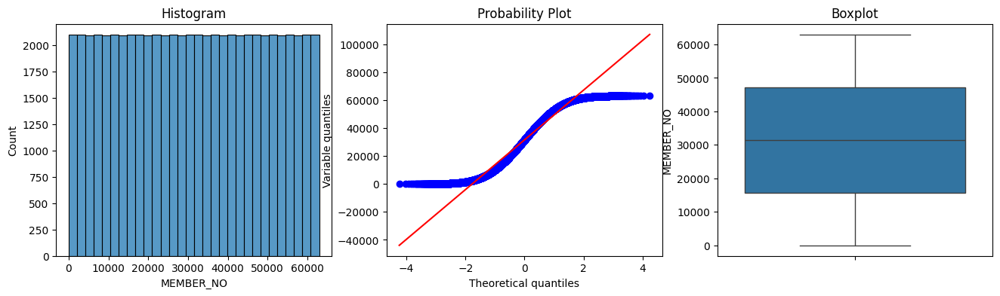

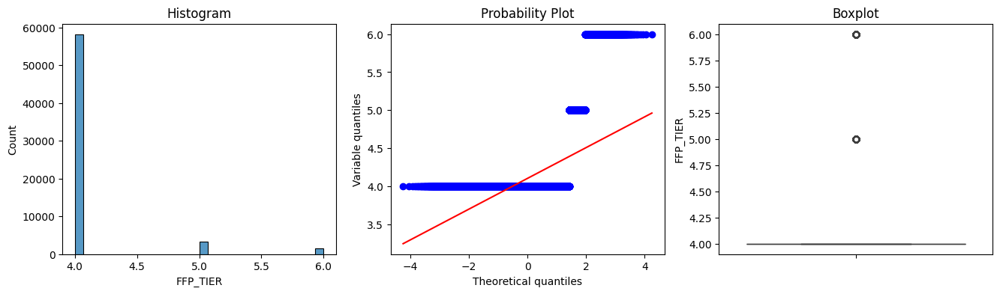

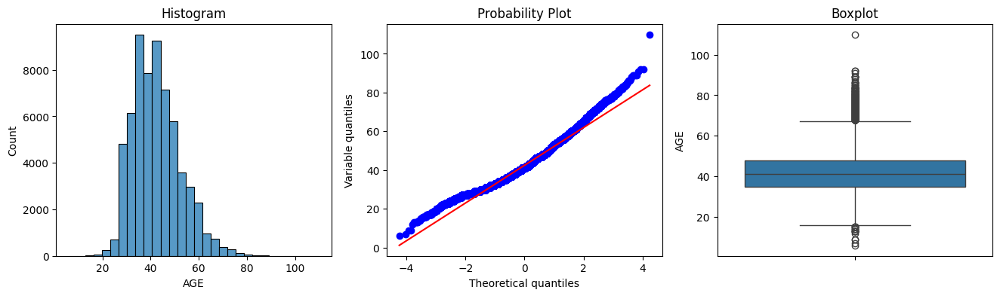

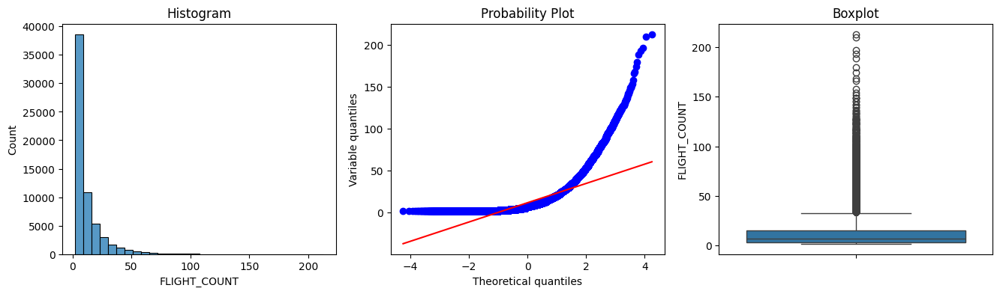

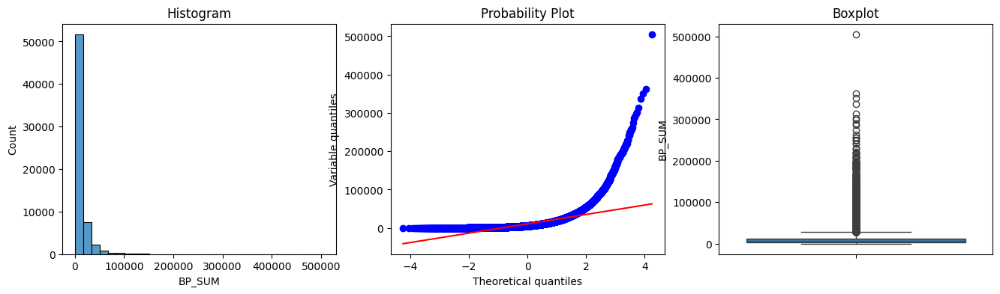

...

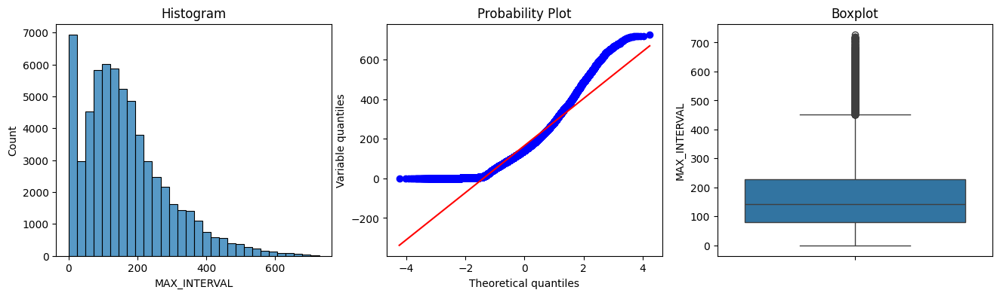

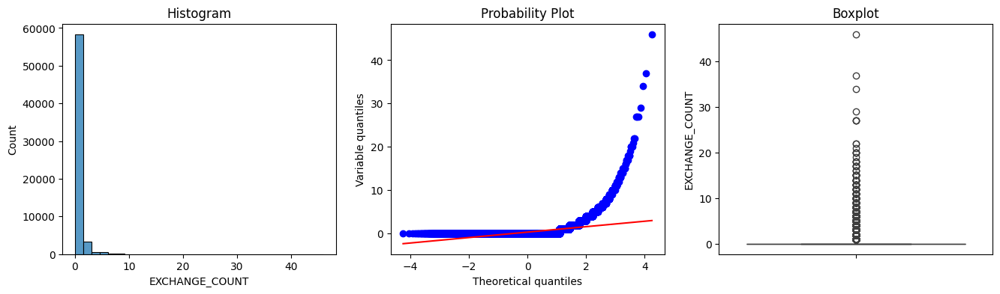

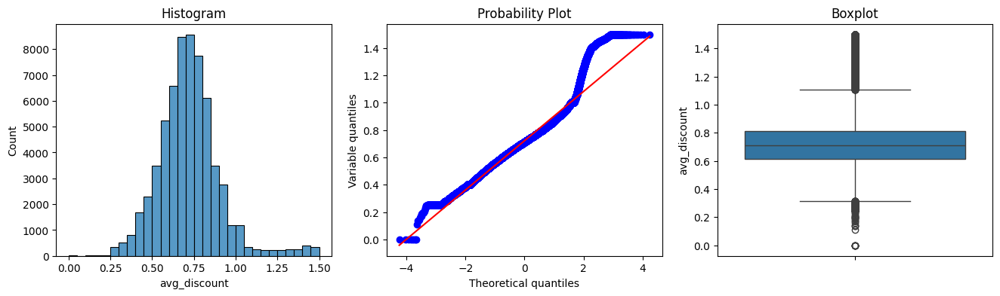

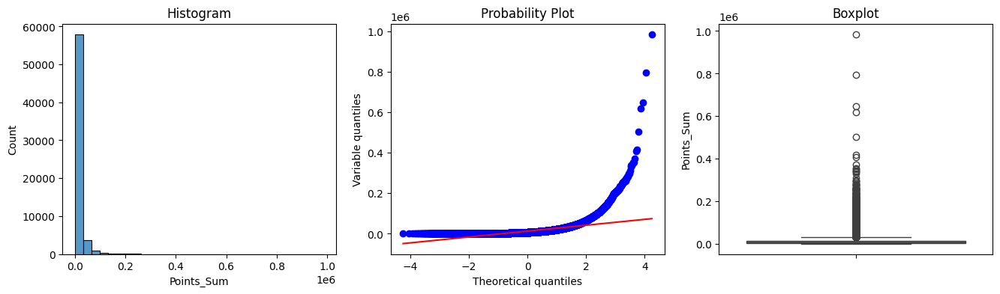

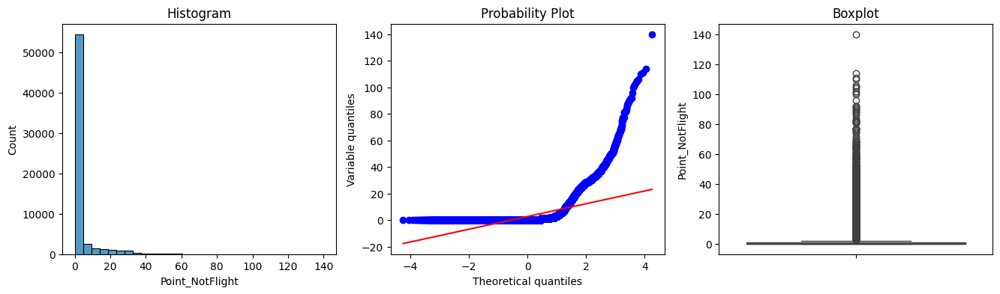

In [ ]:
# Memvisualisasikan outlier
for kolom in ['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight']:
    df_flight = df_flight.copy()
    check_plot(df_flight, kolom)

In [ ]:
# Menghitung IQR, batas atas/bawah, serta memeriksa outlier
def calc_outliers(df_flight, column):
    q1 = df_flight[column].quantile(0.25)
    q3 = df_flight[column].quantile(0.75)
    iqr = q3 - q1
    upper_fence = q3 + 1.5 * iqr
    lower_fence = q1 - 1.5 * iqr

    print(f"\n[{column}]")
    print(f"Q1: {q1:.2f}, Median: {df_flight[column].median():.2f}, Q3: {q3:.2f}")
    print(f"Upper Fence: {upper_fence:.2f}, Lower Fence: {lower_fence:.2f}")
    print(f"Min: {df_flight[column].min():.2f}, Max: {df_flight[column].max():.2f}")

    outliers_upper = df_flight[df_flight[column] > upper_fence][column]
    outliers_lower = df_flight[df_flight[column] < lower_fence][column]

    print(f"Outliers di atas Upper Fence: {list(outliers_upper)}")
    print(f"Outliers di bawah Lower Fence: {list(outliers_lower)}")

# Daftar kolom yang akan dicek
columns_to_check = ['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight']

# Iterasi untuk setiap kolom pada df_flight
for col in columns_to_check:
    calc_outliers(df_flight, col)


[MEMBER_NO]
Q1: 15747.75, Median: 31494.50, Q3: 47241.25
Upper Fence: 94481.50, Lower Fence: -31492.50
Min: 1.00, Max: 62988.00
Outliers di atas Upper Fence: []
Outliers di bawah Lower Fence: []

[FFP_TIER]
Q1: 4.00, Median: 4.00, Q3: 4.00
Upper Fence: 4.00, Lower Fence: 4.00
Min: 4.00, Max: 6.00
Outliers di atas Upper Fence: [6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 5, 6, 6, 6, 6, 5, 6, 6

Outlier dihapus pada beberapa kolom numerik untuk menjaga distribusi data dan akurasi model, kecuali MEMBER_NO (ID unik) serta FFP_TIER, EXCHANGE_COUNT, dan Point_NotFlight yang tetap dipertahankan karena mencerminkan perilaku pelanggan yang relevan untuk segmentasi dan prediksi.

In [ ]:
# Fungsi untuk menghapus outlier
def remove_outliers(df_flight, column):
    q1 = df_flight[column].quantile(0.25)
    q3 = df_flight[column].quantile(0.75)
    iqr = q3 - q1
    upper_fence = q3 + 1.5 * iqr
    lower_fence = q1 - 1.5 * iqr

    df_clean = df_flight[(df_flight[column] >= lower_fence) & (df_flight[column] <= upper_fence)]
    return df_clean

# Kolom yang akan dihapus outlier-nya
columns_to_remove_outliers = ['AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'avg_discount', 'Points_Sum']

# Iterasi untuk menghapus outlier
for col in columns_to_remove_outliers:
    # Menghapus outlier pada df_flight
    df_flight = remove_outliers(df_flight, col)

# Periksa setelah penghapusan outlier
for col in columns_to_remove_outliers:
    calc_outliers(df_flight, col)


[AGE]
Q1: 34.00, Median: 40.00, Q3: 47.00
Upper Fence: 66.50, Lower Fence: 14.50
Min: 16.00, Max: 67.00
Outliers di atas Upper Fence: [67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67]
Outliers di bawah Lower Fence: []

[FLIGHT_COUNT]
Q1: 3.00, Median: 5.00, Q3: 9.00
Upper Fence: 18.00, Lower Fence: -6.00
Min: 2.00, Max: 33.00
Outliers di atas Upper Fence: [27, 27, 22, 25, 24, 23, 21, 21, 24, 21, 23, 20, 21, 19, 30, 21, 24, 22, 20, 31, 25, 21, 19, 21, 20, 27, 24, 21, 20, 27, 24, 24, 23, 25, 20, 19, 24, 19, 28, 19, 24, 25, 19, 30, 24, 20, 20, 20, 29, 33, 23, 30, 19, 19, 20, 20, 26, 28, 19, 26, 25, 21, 19, 20, 26, 22, 2

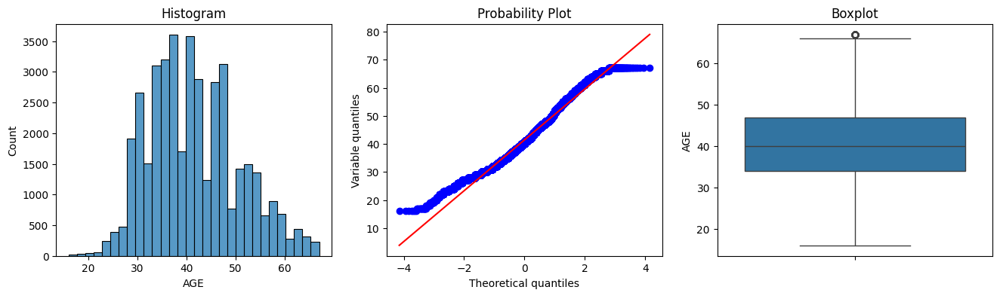

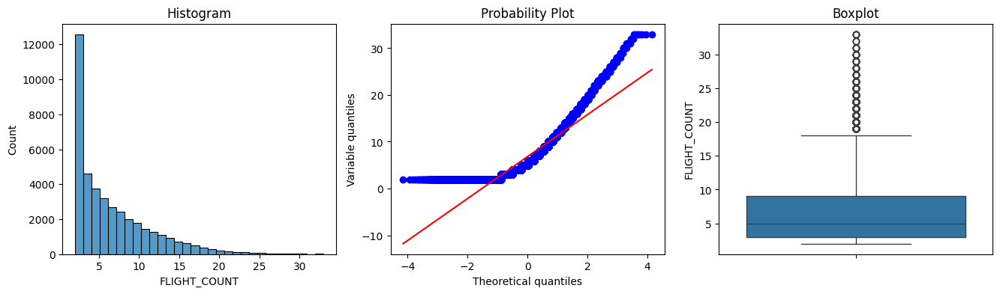

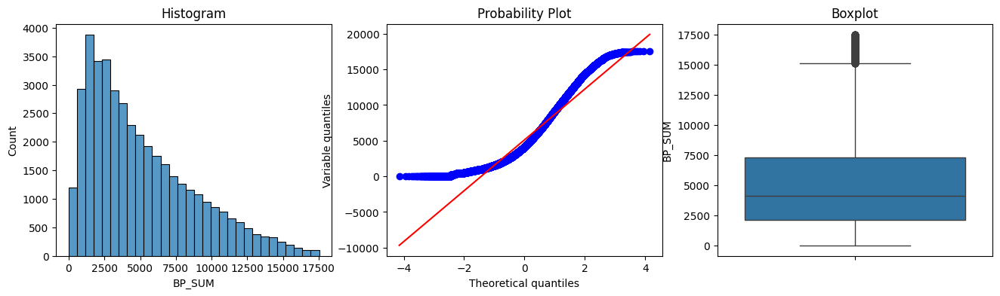

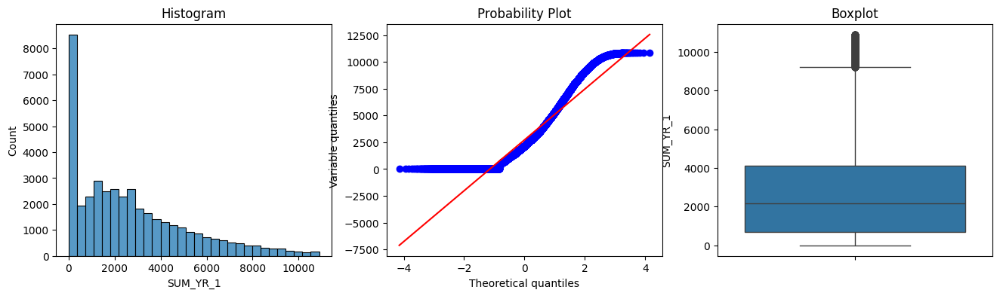

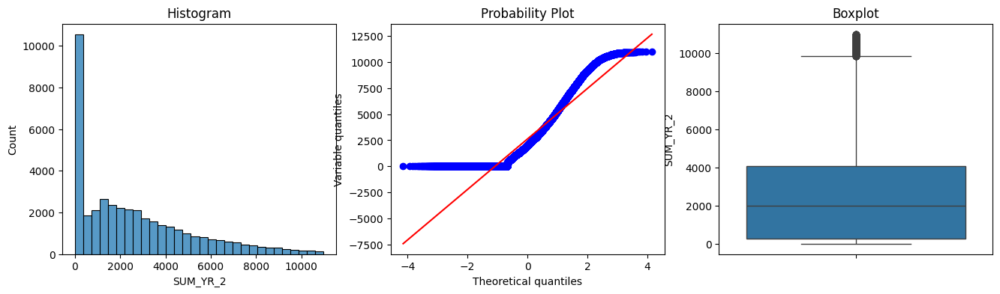

...

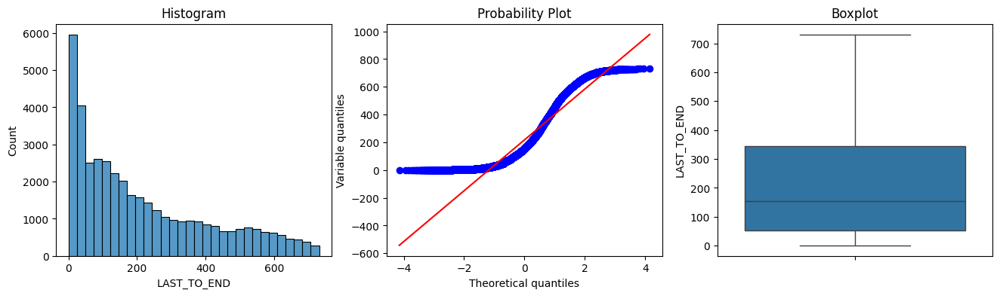

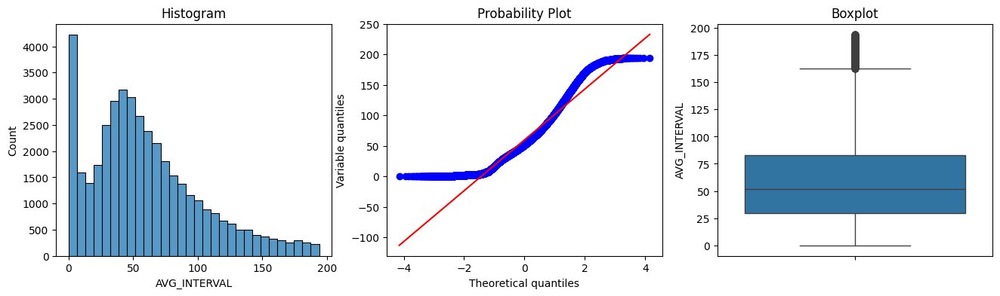

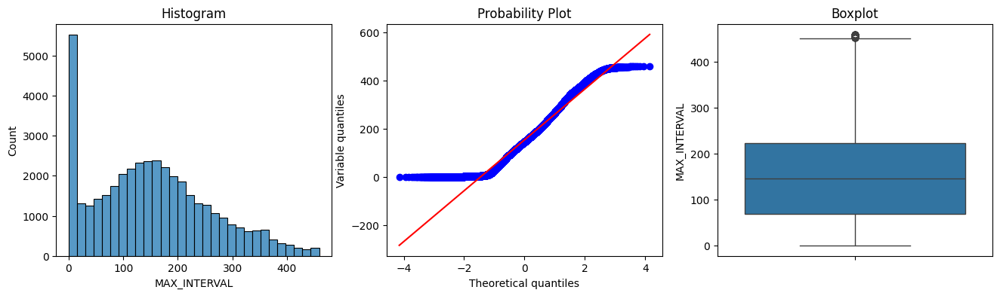

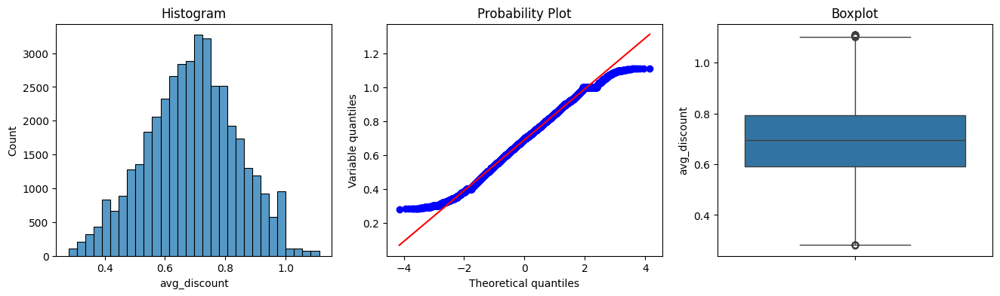

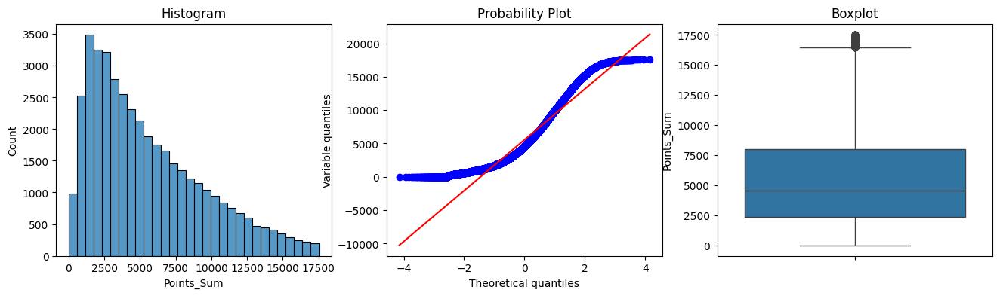

In [ ]:
# Memvisualisasikan outlier
for kolom in ['AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'avg_discount', 'Points_Sum']:
    df_flight = df_flight.copy()
    check_plot(df_flight, kolom)

In [ ]:
df_flight.describe()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
count,41176.0,41176,41176,41176.0,41176.0,41176,41176.0,41176.0,41176.0,41176.0,41176.0,41176,41176.0,41176.0,41176.0,41176.0,41176.0,41176.0,41176.0
mean,31565.217408,2010-05-28 22:05:11.249271808,2010-12-11 04:42:46.932193280,4.016563,41.427142,2014-03-31 00:00:00,6.821134,5112.500729,2725.969965,2623.177579,9187.349815,2013-08-26 19:53:47.899747328,217.577084,59.812083,153.904556,0.089591,0.690167,5548.651326,1.62347
min,1.0,2004-11-01 00:00:00,2004-11-03 00:00:00,4.0,16.0,2014-03-31 00:00:00,2.0,0.0,0.0,0.0,368.0,2012-04-01 00:00:00,1.0,0.0,0.0,0.0,0.280515,0.0,0.0
25%,15831.75,2008-08-07 00:00:00,2009-07-21 00:00:00,4.0,34.0,2014-03-31 00:00:00,3.0,2131.0,708.0,245.0,4175.0,2013-04-22 00:00:00,53.0,29.686678,69.0,0.0,0.589497,2349.0,0.0
50%,31660.5,2011-01-07 00:00:00,2011-08-08 00:00:00,4.0,40.0,2014-03-31 00:00:00,5.0,4122.0,2160.5,2002.0,7662.0,2013-10-29 00:00:00,155.0,51.75,146.0,0.0,0.695015,4545.0,0.0
75%,47357.25,2012-05-15 00:00:00,2012-09-20 00:00:00,4.0,47.0,2014-03-31 00:00:00,9.0,7328.25,4105.0,4079.0,13003.25,2014-02-04 00:00:00,345.0,82.857143,222.0,0.0,0.793847,7997.0,0.0
max,62987.0,2013-03-31 00:00:00,2015-05-30 00:00:00,6.0,67.0,2014-03-31 00:00:00,33.0,17535.0,10898.0,10975.0,27482.0,2014-03-31 00:00:00,731.0,194.0,459.0,15.0,1.11167,17547.0,66.0
std,18179.035344,NaN,NaN,0.159134,9.153457,NaN,4.822815,3723.156614,2502.261681,2571.796652,6143.046628,NaN,194.428978,43.101635,107.793619,0.42555,0.15063,3970.625176,5.091241


Penghapusan outlier membuat distribusi data lebih terpusat dengan rata-rata dan standar deviasi yang lebih wajar.

### Feature Engineering

In [ ]:
df_flight.value_counts().head(50)

,,,,,,,,,,,,,,,,,,,,,,,count
MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,
1,2006-03-31,2007-01-13,Male,4,guangzhou,guangzhou,CN,40,2014-03-31,3,7035,0.0,7200,18770,2013-09-16,198,4.0,7,0,0.658303,7035,0,1
42187,2011-12-31,2011-12-31,Male,4,yibin,yibin,CN,45,2014-03-31,3,2841,3874.0,0,3042,2012-12-21,467,89.0,166,0,0.88999,2841,0,1
42108,2011-11-05,2011-11-05,Male,4,Rolling Meadows,Rolling Meadows,US,44,2014-03-31,10,9521,3222.0,5156,11261,2013-07-15,261,46.555556,211,0,0.89702,9521,0,1
42110,2011-11-18,2011-11-18,Female,4,changshashi,changshashi,CN,27,2014-03-31,8,4025,4427.0,1280,8087,2013-11-14,139,58.571429,300,0,0.744724,5525,1,1
42111,2011-11-18,2011-11-18,Male,4,shenzhen,shenzhen,CN,40,2014-03-31,6,5633,4450.0,1719,7270,2013-07-24,252,84.6,147,0,0.840956,6060,1,1
42113,2011-12-20,2012-05-03,Male,4,beijing,beijing,CN,47,2014-03-31,2,1360,1451.0,0,2022,2012-09-26,553,146.0,146,0,0.790801,1360,0,1
42114,2011-11-05,2011-11-05,Male,4,zigongshi,zigongshi,CN,43,2014-03-31,8,7396,4179.0,2217,12440,2013-09-06,208,42.0,207,0,0.743347,7396,0,1
42115,2011-11-11,2012-04-24,Male,4,guangzhou,guangzhou,CN,47,2014-03-31,8,9732,7874.0,2125,14566,2013-11-18,135,81.857143,252,0,0.778402,9732,0,1
42118,2011-11-25,2011-11-25,Male,4,beijing,beijing,CN,33,2014-03-31,5,1924,2264.0,178,3237,2013-05-14,323,75.25,179,0,0.686021,1924,0,1


In [ ]:
# age grup
df_flight['Age Grup'] = pd.cut(df_flight['AGE'], bins=[0, 12, 22, 39, 59, 100], labels=['Anak-anak', 'Remaja', 'Dewasa muda', 'Dewasa Tua', 'Lansia'])

# Durasi Keanggotaan
df_flight['Durasi Keanggotaan'] = (df_flight['LOAD_TIME'] - df_flight['FFP_DATE']).dt.days / 365
df_flight['Durasi Keanggotaan Grup'] = pd.cut(df_flight['Durasi Keanggotaan'],
                                               bins=[0, 1, 5, df_flight['Durasi Keanggotaan'].max()],
                                               labels=['Baru', 'Menengah', 'Lama'])
# Frekuensi Aktivitas Terbang
df_flight['Frekuensi Terbang'] = df_flight['FLIGHT_COUNT'] + (df_flight['SEG_KM_SUM'] / 1000)
df_flight['Frekuensi Terbang Grup'] = pd.qcut(df_flight['Frekuensi Terbang'], q=3,
                                              labels=['Jarang', 'Sedang', 'Sering'])


Pembuatan fitur baru untuk mempermudah pemahaman dan pengolahan data.
-   Kelompok Umur → Penting untuk melihat perbedaan perilaku pelanggan berdasarkan usia.
-   Durasi Keanggotaan → Berguna untuk memahami loyalitas dan keterikatan pelanggan dengan maskapai.
-   Frekuensi Aktivitas Terbang → Menggambarkan seberapa sering pelanggan menggunakan layanan, sangat relevan untuk segmentasi perilaku.

In [ ]:
df_flight.head()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Age Grup,Durasi Keanggotaan,Durasi Keanggotaan Grup,Frekuensi Terbang,Frekuensi Terbang Grup
9712,52620,2009-07-07,2009-07-13,Male,4,shenyang,shenyang,CN,40,2014-03-31,13,17464,9995.0,9598,25064,2013-12-19,104,41.5,158,1,0.894019,17464,1,Dewasa Tua,4.734247,Menengah,38.064,Sering
10155,46745,2012-03-13,2012-04-24,Male,4,Marienheide,Marienheide,DE,59,2014-03-31,11,15259,5810.0,10037,27482,2014-03-17,15,69.3,322,0,0.790371,15259,0,Dewasa Tua,2.049315,Menengah,38.482,Sering
10271,33721,2012-08-09,2012-08-09,Male,4,shanghai,shanghai,CN,33,2014-03-31,17,16757,672.0,3123,27408,2014-03-05,27,35.875,74,0,0.786079,16757,0,Dewasa muda,1.641096,Menengah,44.408,Sering
10688,38291,2005-10-09,2005-10-09,Male,4,beijing,beijing,CN,49,2014-03-31,13,17481,9460.0,9543,27461,2014-01-19,73,54.833333,154,0,0.761608,17481,0,Dewasa Tua,8.479452,Lama,40.461,Sering
10698,17921,2008-11-17,2008-11-17,Male,4,shenyang,shenyang,CN,34,2014-03-31,14,16689,9300.0,10046,20591,2013-09-18,196,27.615385,108,7,1.014716,16689,7,Dewasa muda,5.369863,Lama,34.591,Sering


In [ ]:
df_flight.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 9712 to 62975
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   MEMBER_NO                41176 non-null  Int64         
 1   FFP_DATE                 41176 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE        41176 non-null  datetime64[ns]
 3   GENDER                   41176 non-null  category      
 4   FFP_TIER                 41176 non-null  Int64         
 5   WORK_CITY                41176 non-null  category      
 6   WORK_PROVINCE            41176 non-null  category      
 7   WORK_COUNTRY             41176 non-null  category      
 8   AGE                      41176 non-null  Int64         
 9   LOAD_TIME                41176 non-null  datetime64[ns]
 10  FLIGHT_COUNT             41176 non-null  Int64         
 11  BP_SUM                   41176 non-null  Int64         
 12  SUM_YR_1                 41176 non

In [ ]:
#  Kategorik
kategorik = ['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'Age Grup', 'Durasi Keanggotaan Grup', 'Frekuensi Terbang Grup']

# Numerik (Int dan Float)
numerik = ['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2',
           'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT',
           'avg_discount', 'Points_Sum', 'Point_NotFlight', 'Durasi Keanggotaan', 'Frekuensi Terbang']

# Datetime
datetime = ['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']

## `EXPLORATORY DATA ANALYSIS (EDA)`

Tahap ini bertujuan untuk mengidentifikasi pola, ketidak wajaran atau data yang menyimpang, dan hubungan antar variabel, sekaligus memberikan gambaran umum tentang data.

### Perbandingan Antara Umur dan Gender Pelanggan

In [ ]:
age = df_flight['AGE'].value_counts().sort_index()
age_df = age.to_frame().transpose()
age_df


AGE,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67
count,7,16,12,19,22,22,53,103,144,164,229,481,854,1056,1233,1425,1508,1510,1587,1593,1605,1805,1796,1708,1688,1897,1700,1187,1241,1354,1483,1688,1441,764,795,626,736,760,703,657,663,455,442,363,321,282,226,209,159,154,124,106


In [ ]:
gender_age = df_flight.groupby(['GENDER', 'Age Grup']).size().unstack()
gender_age

Age Grup,Anak-anak,Remaja,Dewasa muda,Dewasa Tua,Lansia
GENDER,,,,,
Female,0,89,5930,4179,262
Male,0,62,12871,16464,1319


### Demografi dan Aktivitas Terbang

a. Hubungan antara Gender dan Frekuensi Terbang

In [ ]:
# Distribusi Frekuensi Terbang Berdasarkan Gender
gender_frekuensi = df_flight.groupby(['GENDER', 'Frekuensi Terbang Grup']).size().unstack()
display(gender_frekuensi)

Frekuensi Terbang Grup,Jarang,Sedang,Sering
GENDER,,,
Female,3876,3521,3063
Male,9849,10208,10659


b. Distribusi Frekuensi Terbang berdasarkan Kelompok Umur

In [ ]:
# Distribusi Frekuensi Terbang Berdasarkan Kelompok Umur
age_frekuensi = df_flight.groupby(['Age Grup', 'Frekuensi Terbang Grup']).size().unstack()
display(age_frekuensi)


Frekuensi Terbang Grup,Jarang,Sedang,Sering
Age Grup,,,
Anak-anak,0,0,0
Remaja,64,49,38
Dewasa muda,6742,6428,5631
Dewasa Tua,6390,6733,7520
Lansia,529,519,533


c. Hubungan antara Kelompok Umur dan Durasi Keanggotaan

In [ ]:
# Hubungan Kelompok Umur dengan Durasi Keanggotaan
age_keanggotaan = df_flight.groupby(['Age Grup', 'Durasi Keanggotaan Grup']).size().unstack()
display(age_keanggotaan)


Durasi Keanggotaan Grup,Baru,Menengah,Lama
Age Grup,,,
Anak-anak,0,0,0
Remaja,0,139,12
Dewasa muda,14,15106,3681
Dewasa Tua,14,12304,8325
Lansia,0,836,745


 ### Loyalitas dan Tingkat Keanggotaan

a. Hubungan FFP_TIER dengan Frekuensi Terbang

In [ ]:
ffp_frekuensi = df_flight.groupby(['FFP_TIER', 'Frekuensi Terbang Grup']).size().unstack()
ffp_frekuensi

Frekuensi Terbang Grup,Jarang,Sedang,Sering
FFP_TIER,,,
4,13620,13594,13466
5,44,78,188
6,61,57,68


b. Hubungan FFP_TIER dengan Durasi Keanggotaan

In [ ]:
ffp_keanggotaan = df_flight.groupby(['FFP_TIER', 'Durasi Keanggotaan Grup']).size().unstack()
ffp_keanggotaan

Durasi Keanggotaan Grup,Baru,Menengah,Lama
FFP_TIER,,,
4,28,28079,12573
5,0,195,115
6,0,111,75


### Geografi dan Pola Terbang

a. Pengaruh Negara Tempat Kerja terhadap Frekuensi Terbang

In [ ]:
work_country_frekuensi = df_flight.groupby(['WORK_COUNTRY', 'Frekuensi Terbang Grup']).size().unstack()
work_country_frekuensi_df = work_country_frekuensi.T
work_country_frekuensi_df

WORK_COUNTRY,AA,AB,AE,AN,AR,AS,AT,AU,AZ,BB,BD,BE,BG,BI,BN,BR,BS,BZ,CA,CC,CD,CH,CL,CM,CN,CR,CY,DE,DK,EC,EG,ES,FA,FI,FL,FO,FR,GB,GE,GH,GL,GN,GT,GU,HK,HN,HU,IA,ID,IE,IL,IN,IR,IT,JP,KA,KE,KH,KO,KR,KZ,LA,LB,MA,MN,MO,MS,MV,MX,MY,MZ,NE,NG,NI,NL,NO,NZ,OM,PA,PE,PH,PK,PN,PP,PR,PS,PT,RE,RO,RU,SA,SE,SG,SI,SK,SN,SU,SW,TH,TK,TR,TW,UA,UK,US,UV,UY,UZ,VN,VT,YE,ZA,ZW,cn,中,北,沈,芬
Frekuensi Terbang Grup,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Jarang,1,0,0,1,2,0,1,22,0,0,1,11,1,0,1,1,1,0,23,0,0,1,0,1,12545,1,0,15,1,0,1,3,0,1,0,0,8,3,1,1,0,0,0,0,219,0,1,1,18,1,1,7,1,1,162,1,0,0,0,269,0,1,0,1,0,5,0,1,1,30,0,0,2,2,2,0,1,0,0,0,34,6,0,1,0,0,1,0,0,1,2,1,78,0,1,1,0,0,19,0,1,78,0,1,87,0,2,0,13,8,0,3,1,1,7,0,1,1
Sedang,1,0,4,3,0,0,0,49,0,1,1,9,0,0,0,0,0,0,10,0,1,6,0,0,12682,0,1,9,1,0,0,1,0,0,0,1,13,1,2,0,0,0,0,0,233,1,0,0,15,0,2,1,1,9,137,1,0,3,0,181,1,0,1,3,0,6,0,1,0,37,1,1,1,0,9,0,1,0,0,0,29,7,1,0,1,0,0,0,1,0,0,3,57,1,0,0,1,0,14,1,0,66,2,5,73,0,0,0,14,10,0,0,0,0,0,1,0,0
Sering,2,0,3,2,0,0,0,69,0,0,0,7,0,0,0,0,0,1,4,0,0,0,0,0,12852,0,0,6,0,0,0,1,0,1,0,0,8,0,0,0,0,0,0,0,225,0,2,0,15,0,1,1,1,4,87,0,1,3,0,107,0,0,1,1,0,9,0,0,0,28,0,0,1,0,8,0,1,0,0,0,28,2,0,0,0,1,0,1,0,0,0,0,44,0,0,0,0,0,13,0,0,66,0,3,92,0,0,1,12,3,1,1,0,0,2,0,0,0


b. Hubungan WORK_COUNTRY dengan FFP_TIER

In [ ]:
work_country_ffp = df_flight.groupby(['WORK_COUNTRY', 'FFP_TIER']).size().unstack()
work_country_ffp_df = work_country_ffp.T
work_country_ffp_df


WORK_COUNTRY,AA,AB,AE,AN,AR,AS,AT,AU,AZ,BB,BD,BE,BG,BI,BN,BR,BS,BZ,CA,CC,CD,CH,CL,CM,CN,CR,CY,DE,DK,EC,EG,ES,FA,FI,FL,FO,FR,GB,GE,GH,GL,GN,GT,GU,HK,HN,HU,IA,ID,IE,IL,IN,IR,IT,JP,KA,KE,KH,KO,KR,KZ,LA,LB,MA,MN,MO,MS,MV,MX,MY,MZ,NE,NG,NI,NL,NO,NZ,OM,PA,PE,PH,PK,PN,PP,PR,PS,PT,RE,RO,RU,SA,SE,SG,SI,SK,SN,SU,SW,TH,TK,TR,TW,UA,UK,US,UV,UY,UZ,VN,VT,YE,ZA,ZW,cn,中,北,沈,芬
FFP_TIER,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,4,0,7,5,2,0,1,138,0,1,2,27,1,0,1,1,1,1,37,0,1,7,0,1,37588,1,1,30,2,0,1,5,0,2,0,1,29,4,3,1,0,0,0,0,677,1,3,1,48,1,4,9,3,14,386,2,1,6,0,557,1,1,2,5,0,20,0,2,1,95,1,1,4,2,19,0,3,0,0,0,91,15,1,1,1,1,1,1,1,1,2,4,179,1,1,1,1,0,46,1,1,210,2,9,251,0,2,1,39,21,1,4,1,1,8,1,1,1
5,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,305,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,186,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Poin dan Pendapatan

a. Hubungan antara Frekuensi Terbang dan Total Poin

In [ ]:
frekuensi_points = df_flight.groupby('Frekuensi Terbang Grup')['Points_Sum'].describe()
frekuensi_points_df = frekuensi_points.reset_index()
frekuensi_points_df


,Frekuensi Terbang Grup,count,mean,std,min,25%,50%,75%,max
0,Jarang,13725.0,2301.484226,1876.89706,0.0,1202.0,1874.0,2816.0,17546.0
1,Sedang,13729.0,4842.498652,2435.944596,0.0,3184.0,4441.0,5998.0,17526.0
2,Sering,13722.0,9503.041248,3341.641131,500.0,6972.0,9235.5,11804.0,17547.0


b. Pengaruh Frekuensi Terbang terhadap Bonus Point

In [ ]:
frekuensi_bonus = df_flight.groupby('Frekuensi Terbang Grup')['BP_SUM'].describe()
frekuensi_bonus_df = frekuensi_bonus.reset_index()
frekuensi_bonus_df

,Frekuensi Terbang Grup,count,mean,std,min,25%,50%,75%,max
0,Jarang,13725.0,1882.210783,1081.87434,0.0,1087.0,1685.0,2490.0,7628.0
1,Sedang,13729.0,4402.736907,1951.025313,0.0,3025.0,4158.0,5530.0,17337.0
2,Sering,13722.0,9053.622796,3184.840708,500.0,6693.0,8783.0,11172.75,17535.0


c. Kontribusi Poin dari Aktivitas Non-Terbang

In [ ]:

points_nonflight = df_flight[['Points_Sum', 'Point_NotFlight']].describe()
points_nonflight_df = points_nonflight.reset_index()
points_nonflight_df


,index,Points_Sum,Point_NotFlight
0,count,41176.0,41176.0
1,mean,5548.651326,1.62347
2,std,3970.625176,5.091241
3,min,0.0,0.0
4,25%,2349.0,0.0
5,50%,4545.0,0.0
6,75%,7997.0,0.0
7,max,17547.0,66.0


### Pola Pembelian dan Diskon

a. Pengaruh Diskon terhadap Total Pembelian Tiket

In [ ]:

discount_pembelian = df_flight.groupby('avg_discount')[['SUM_YR_1', 'SUM_YR_2']].mean()
discount_pembelian_df = discount_pembelian.T
discount_pembelian_df

avg_discount,0.280515,0.280801,0.281304,0.281486,0.28226,0.282552,0.282574,0.283333,0.285,0.286598,0.286853,0.286931,0.287466,0.287701,0.28824,0.289163,0.289481,0.289588,0.289853,0.29,0.290868,0.291146,0.291632,0.29198,0.292462,0.2925,0.293333,0.293364,0.293506,0.293743,0.293882,0.294632,0.294764,0.294816,0.295,0.295064,0.297475,0.298053,0.299421,0.299964,0.3,0.300108,0.300162,0.300486,0.3012,0.301517,0.301946,0.30252,0.30343,0.304,0.304335,0.304623,0.305,0.306,0.306718,0.306838,0.307001,0.30712,0.307365,0.3075,0.308764,0.308986,0.309139,0.309333,0.309366,0.309651,0.309716,0.309722,0.31,0.310166,0.31046,0.310822,0.311161,0.312061,0.3125,0.312723,0.313501,0.313633,0.313847,0.313862,0.31391,0.314117,0.314709,0.315,0.315327,0.315641,0.315783,0.316012,0.316386,0.316667,0.316783,0.316838,0.316875,0.317011,0.3175,0.317624,0.317766,0.317898,0.317961,0.31878,0.318817,0.319006,0.319123,0.319149,0.319188,0.319503,0.319671,0.32,0.320081,0.320306,0.320341,0.320448,0.320497,0.320648,0.320662,0.320983,0.321157,0.321198,0.32141,0.321559,0.321695,0.32188,0.322347,0.322438,0.322699,0.322747,0.323008,0.323132,0.323741,0.323957,0.323995,0.324,0.324945,0.325,0.325161,0.325464,0.325538,0.325583,0.325665,0.325781,0.326118,0.326134,0.326141,0.326151,0.32625,0.326259,0.326352,0.326667,0.326691,0.326772,0.326824,0.326891,0.326892,0.32719,0.32807,0.328107,0.328227,0.328549,0.328611,0.328641,0.328682,0.328862,0.32942,0.32962,0.33,0.330004,0.330127,0.33034,0.330822,0.330903,0.331378,0.331559,0.332102,0.332129,0.332365,0.332435,0.332585,0.332849,0.332944,0.333065,0.333133,0.333299,0.333333,0.333406,0.333519,0.333584,0.333588,0.333752,0.333876,0.334062,0.33415,0.334286,0.3343,0.334444,0.334449,0.334477,0.334605,0.334633,0.334781,0.334978,0.335,0.33501,0.335146,0.335253,0.335281,0.335293,0.335723,0.336544,0.336644,0.336688,0.336813,0.336993,0.337041,0.337087,0.337429,0.3375,0.337543,0.337685,0.337835,0.338022,0.338119,0.33871,0.338899,0.339329,0.339598,0.33968,0.339923,0.34,0.340041,0.340106,0.340147,0.340687,0.341439,0.34149,0.341514,0.341633,0.34164,0.342,0.342067,0.342067,0.342225,0.342494,0.342615,0.342775,0.342812,0.342977,0.343385,0.343399,0.343663,0.34374,0.343788,0.344151,0.344392,0.34445,0.345001,0.34515,0.345322,0.34554,0.345565,0.345694,0.345954,0.345987,0.346178,0.346374,0.346507,0.346534,0.346589,0.346618,0.346627,0.346667,0.346687,0.346974,0.347066,0.347153,0.347169,0.34728,0.3475,0.347547,0.347697,0.347741,0.34785,0.347874,0.34795,0.348164,0.34818,0.348186,0.348298,0.348362,0.348646,0.348919,0.34909,0.349226,0.349302,0.349588,0.349644,0.349809,0.349892,0.349952,0.35,0.350086,0.350133,0.35019,0.350345,0.350417,0.35044,0.350515,0.350583,0.350756,0.350815,0.350985,0.351105,0.351177,0.351228,0.351241,0.351443,0.352,0.352105,0.352145,0.352704,0.352775,0.352914,0.353263,0.353333,0.353489,0.353591,0.353715,0.35375,0.353776,0.353932,0.354204,0.354401,0.354402,0.354511,0.35463,0.354635,0.354641,0.354796,0.354887,0.355,0.355021,0.355147,0.355173,0.355298,0.355715,0.35576,0.355861,0.355961,0.356038,0.356281,0.356509,0.356517,0.35653,0.356667,0.35679,0.356797,0.356922,0.356968,0.357025,0.357129,0.357138,0.357423,0.357575,0.35784,0.358187,0.3582,0.358285,0.358601,0.358991,0.359076,0.359079,0.359206,0.359298,0.359862,0.359919,0.359934,0.359963,0.359989,0.36,0.360108,0.36025,0.360292,0.360296,0.360633,0.360809,0.360872,0.360902,0.360922,0.361052,0.361146,0.361464,0.361591,0.361619,0.361769,0.361815,0.362046,0.362131,0.362267,0.362422,0.362585,0.362625,0.362648,0.362723,0.362908,0.363333,0.363677,0.363717,0.363948,0.364,0.364052,0.364103,0.364218,0.364679,0.364772,0.365,0.365044,0.365135,0.36518,0.365202,0.365265,0.365284,0.365342,0.365464,0.3655,0.365654,0.365718,0.365977,0.366,0.366081,0.366121,0.366245,0.366252,0.366253,0.36663,0.366667,0.36668,0.366787,0.366972,0.36698,0.367386,0.367414,0.367463,0.3675,0.367509,0.367716,0.367757,0.367887,0.368122,0.368137,0.368182,0.368937,0.369135,0.369227,0.369339,0.36934,0.369406,0.369411,0.369488,0.369651,0.369666,0.

b. Hubungan antara Diskon dan Frekuensi Terbang

In [ ]:
discount_frekuensi = df_flight.groupby('avg_discount')['Frekuensi Terbang'].mean()
discount_frekuensi_df = discount_frekuensi.to_frame().T
discount_frekuensi_df

avg_discount,0.280515,0.280801,0.281304,0.281486,0.28226,0.282552,0.282574,0.283333,0.285,0.286598,0.286853,0.286931,0.287466,0.287701,0.28824,0.289163,0.289481,0.289588,0.289853,0.29,0.290868,0.291146,0.291632,0.29198,0.292462,0.2925,0.293333,0.293364,0.293506,0.293743,0.293882,0.294632,0.294764,0.294816,0.295,0.295064,0.297475,0.298053,0.299421,0.299964,0.3,0.300108,0.300162,0.300486,0.3012,0.301517,0.301946,0.30252,0.30343,0.304,0.304335,0.304623,0.305,0.306,0.306718,0.306838,0.307001,0.30712,0.307365,0.3075,0.308764,0.308986,0.309139,0.309333,0.309366,0.309651,0.309716,0.309722,0.31,0.310166,0.31046,0.310822,0.311161,0.312061,0.3125,0.312723,0.313501,0.313633,0.313847,0.313862,0.31391,0.314117,0.314709,0.315,0.315327,0.315641,0.315783,0.316012,0.316386,0.316667,0.316783,0.316838,0.316875,0.317011,0.3175,0.317624,0.317766,0.317898,0.317961,0.31878,0.318817,0.319006,0.319123,0.319149,0.319188,0.319503,0.319671,0.32,0.320081,0.320306,0.320341,0.320448,0.320497,0.320648,0.320662,0.320983,0.321157,0.321198,0.32141,0.321559,0.321695,0.32188,0.322347,0.322438,0.322699,0.322747,0.323008,0.323132,0.323741,0.323957,0.323995,0.324,0.324945,0.325,0.325161,0.325464,0.325538,0.325583,0.325665,0.325781,0.326118,0.326134,0.326141,0.326151,0.32625,0.326259,0.326352,0.326667,0.326691,0.326772,0.326824,0.326891,0.326892,0.32719,0.32807,0.328107,0.328227,0.328549,0.328611,0.328641,0.328682,0.328862,0.32942,0.32962,0.33,0.330004,0.330127,0.33034,0.330822,0.330903,0.331378,0.331559,0.332102,0.332129,0.332365,0.332435,0.332585,0.332849,0.332944,0.333065,0.333133,0.333299,0.333333,0.333406,0.333519,0.333584,0.333588,0.333752,0.333876,0.334062,0.33415,0.334286,0.3343,0.334444,0.334449,0.334477,0.334605,0.334633,0.334781,0.334978,0.335,0.33501,0.335146,0.335253,0.335281,0.335293,0.335723,0.336544,0.336644,0.336688,0.336813,0.336993,0.337041,0.337087,0.337429,0.3375,0.337543,0.337685,0.337835,0.338022,0.338119,0.33871,0.338899,0.339329,0.339598,0.33968,0.339923,0.34,0.340041,0.340106,0.340147,0.340687,0.341439,0.34149,0.341514,0.341633,0.34164,0.342,0.342067,0.342067,0.342225,0.342494,0.342615,0.342775,0.342812,0.342977,0.343385,0.343399,0.343663,0.34374,0.343788,0.344151,0.344392,0.34445,0.345001,0.34515,0.345322,0.34554,0.345565,0.345694,0.345954,0.345987,0.346178,0.346374,0.346507,0.346534,0.346589,0.346618,0.346627,0.346667,0.346687,0.346974,0.347066,0.347153,0.347169,0.34728,0.3475,0.347547,0.347697,0.347741,0.34785,0.347874,0.34795,0.348164,0.34818,0.348186,0.348298,0.348362,0.348646,0.348919,0.34909,0.349226,0.349302,0.349588,0.349644,0.349809,0.349892,0.349952,0.35,0.350086,0.350133,0.35019,0.350345,0.350417,0.35044,0.350515,0.350583,0.350756,0.350815,0.350985,0.351105,0.351177,0.351228,0.351241,0.351443,0.352,0.352105,0.352145,0.352704,0.352775,0.352914,0.353263,0.353333,0.353489,0.353591,0.353715,0.35375,0.353776,0.353932,0.354204,0.354401,0.354402,0.354511,0.35463,0.354635,0.354641,0.354796,0.354887,0.355,0.355021,0.355147,0.355173,0.355298,0.355715,0.35576,0.355861,0.355961,0.356038,0.356281,0.356509,0.356517,0.35653,0.356667,0.35679,0.356797,0.356922,0.356968,0.357025,0.357129,0.357138,0.357423,0.357575,0.35784,0.358187,0.3582,0.358285,0.358601,0.358991,0.359076,0.359079,0.359206,0.359298,0.359862,0.359919,0.359934,0.359963,0.359989,0.36,0.360108,0.36025,0.360292,0.360296,0.360633,0.360809,0.360872,0.360902,0.360922,0.361052,0.361146,0.361464,0.361591,0.361619,0.361769,0.361815,0.362046,0.362131,0.362267,0.362422,0.362585,0.362625,0.362648,0.362723,0.362908,0.363333,0.363677,0.363717,0.363948,0.364,0.364052,0.364103,0.364218,0.364679,0.364772,0.365,0.365044,0.365135,0.36518,0.365202,0.365265,0.365284,0.365342,0.365464,0.3655,0.365654,0.365718,0.365977,0.366,0.366081,0.366121,0.366245,0.366252,0.366253,0.36663,0.366667,0.36668,0.366787,0.366972,0.36698,0.367386,0.367414,0.367463,0.3675,0.367509,0.367716,0.367757,0.367887,0.368122,0.368137,0.368182,0.368937,0.369135,0.369227,0.369339,0.36934,0.369406,0.369411,0.369488,0.369651,0.369666,0.

### Waktu dan Durasi Keanggotaan

a. Hubungan antara Durasi Keanggotaan dan Frekuensi Terbang

In [ ]:
durasi_frekuensi = df_flight.groupby('Durasi Keanggotaan Grup')['Frekuensi Terbang'].describe()
durasi_frekuensi_df = durasi_frekuensi.reset_index()
durasi_frekuensi_df

,Durasi Keanggotaan Grup,count,mean,std,min,25%,50%,75%,max
0,Baru,28.0,13.369714,8.83216,3.866,6.5095,10.702,18.5035,34.474
1,Menengah,28385.0,15.535119,10.17939,2.368,7.304,12.783,21.622,59.898
2,Lama,12763.0,17.067039,10.879289,2.368,8.045,14.594,23.9835,59.12


b. Pengaruh Durasi Keanggotaan terhadap FFP_TIER

In [ ]:
durasi_ffp = df_flight.groupby('Durasi Keanggotaan Grup')['FFP_TIER'].value_counts().unstack()
display(durasi_ffp)


FFP_TIER,4,5,6
Durasi Keanggotaan Grup,,,
Baru,28,0,0
Menengah,28079,195,111
Lama,12573,115,75


### Aktivitas Penukaran Poin

a. Hubungan antara Frekuensi Penukaran Poin dan Total Poin

In [ ]:
exchange_points = df_flight.groupby('EXCHANGE_COUNT')['Points_Sum'].mean().fillna(0)
exchange_points_df = exchange_points.to_frame().T
exchange_points_df


EXCHANGE_COUNT,0,1,2,3,4,5,6,7,8,10,11,15
Points_Sum,5307.929003,9202.663761,9616.09015,9586.655172,10668.561404,10466.647059,8901.25,8889.2,12046.0,7435.0,7968.0,7783.0


b. Pengaruh FFP_TIER terhadap Frekuensi Penukaran Poin

In [ ]:

exchange_ffp = df_flight.groupby('EXCHANGE_COUNT')['FFP_TIER'].value_counts().unstack().fillna(0)
exchange_ffp_df = exchange_ffp.T
exchange_ffp_df


EXCHANGE_COUNT,0,1,2,3,4,5,6,7,8,10,11,15
FFP_TIER,,,,,,,,,,,,
4,38283,1576,592,143,55,13,8,5,1,2,1,1
5,282,22,2,1,1,2,0,0,0,0,0,0
6,169,8,5,1,1,2,0,0,0,0,0,0


## `MODEL PREPARATION`

### Handling Data Categorical

In [ ]:
print("Kolom numerikal:", numerik, "\nKolom kategorikal:", kategorik)

Kolom numerikal: ['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight', 'Durasi Keanggotaan', 'Frekuensi Terbang'] 
Kolom kategorikal: ['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'Age Grup', 'Durasi Keanggotaan Grup', 'Frekuensi Terbang Grup']


In [ ]:
from sklearn.preprocessing import LabelEncoder
# Label Encoding untuk kategori ordinal
le = LabelEncoder()
label_cols = ['Age Grup', 'Durasi Keanggotaan Grup', 'Frekuensi Terbang Grup']

for col in label_cols:
    df_flight[col] = le.fit_transform(df_flight[col])

# One-Hot Encoding untuk kategori nominal
kolom_ohe = ['GENDER', 'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']
df_flight = pd.get_dummies(df_flight, columns=kolom_ohe, drop_first=False, dtype=int)

Dengan` drop_first=False`, semua kategori tetap ada dan lebih akurat dalam menangkap variasi antar kelompok. Multikolinearitas hanya menjadi masalah pada model regresi, bukan di unsupervised learning seperti K-Means. Jadi, tidak ada alasan untuk menghapus satu kategori.

In [ ]:
df_flight.sample(5)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Age Grup,Durasi Keanggotaan,Durasi Keanggotaan Grup,Frekuensi Terbang,Frekuensi Terbang Grup,GENDER_Female,GENDER_Male,WORK_CITY_#NAME?,WORK_CITY_*,WORK_CITY_**,WORK_CITY_--,WORK_CITY_.beijing,WORK_CITY_.kunming,WORK_CITY_.shanghai,WORK_CITY_.shenzhen,WORK_CITY_.xishui,WORK_CITY_.zhaoyangqu,WORK_CITY_.zhongqing,WORK_CITY_/,WORK_CITY_0,WORK_CITY_1,"WORK_CITY_1-2-1 OHTEMACHI,CHIYODA-KU,",WORK_CITY_12961,WORK_CITY_13720514406,WORK_CITY_33 CONDUIT ROAD,WORK_CITY_5,WORK_CITY_50668 KOELN,WORK_CITY_6400sonderboro,WORK_CITY_75003,WORK_CITY_9460 BNOUST,WORK_CITY_=,WORK_CITY_?,WORK_CITY_AACMEN,WORK_CITY_ABA,WORK_CITY_ABBOTSFORD,WORK_CITY_ABIKO-SHI,WORK_CITY_ACCRA,WORK_CITY_ACT,WORK_CITY_ACTONA MEADOWS,WORK_CITY_ADACHI-KU,WORK_CITY_AHMEDABAD,WORK_CITY_AICADIA,WORK_CITY_AIHAMBRA,WORK_CITY_AKAIWA CITY,WORK_CITY_AKISHIMA-SHI,WORK_CITY_ALHAMBRA,WORK_CITY_ALHAMBRA CA,WORK_CITY_ALISO VIEJO,WORK_CITY_ALLHAMING,WORK_CITY_ALMATY,WORK_CITY_ALMHULT,WORK_CITY_ALOR SETAR,WORK_CITY_ALOR STAR,WORK_CITY_ALPHARETTA,WORK_CITY_ALPINE,WORK_CITY_ALTA LOMA,WORK_CITY_ALTRINC HAM,WORK_CITY_AMA-GUN,WORK_CITY_AMAGASAKI,WORK_CITY_AMAGASAKI-SHI,WORK_CITY_AMAHEIM,WORK_CITY_AMNILA,WORK_CITY_AMSTELVEEN,WORK_CITY_AMSTERDAM,WORK_CITY_ANAHEIM,WORK_CITY_ANDE,WORK_CITY_ANDRESY,WORK_CITY_ANG MO LAO,WORK_CITY_ANGELES CITY,WORK_CITY_ANGYO-SHI,WORK_CITY_ANJO-SHI,WORK_CITY_ANNAPOLIS,WORK_CITY_ANPACHI-GUN,WORK_CITY_ANSAN SHI,WORK_CITY_ANYANGSI,WORK_CITY_AOMORI-SHI,WORK_CITY_APCADIA,WORK_CITY_APPLETON,WORK_CITY_ARCADIA,WORK_CITY_ARCADIA CA 91007,WORK_CITY_ARCADIA LA,WORK_CITY_ARCIDA,WORK_CITY_ARLINGTON,WORK_CITY_ARNCHO SANTA MARGARITA,WORK_CITY_ARTARMON,WORK_CITY_ASAKA-SHI,WORK_CITY_ASHFIELD,WORK_CITY_ATHENS,WORK_CITY_ATHERTON,WORK_CITY_ATTOK,WORK_CITY_AUBERVILLIERS,WORK_CITY_AUCKLAND,WORK_CITY_AUD,WORK_CITY_AUSTIN,WORK_CITY_AUSTRALA,WORK_CITY_AUSTRALIA,WORK_CITY_AUSTRIA,WORK_CITY_AWARA-SHI,WORK_CITY_AYAUTA-GUN,WORK_CITY_AZUMINO-SHI,WORK_CITY_Agoura Hills,WORK_CITY_Aioi-shi,WORK_CITY_Aisai-shi,WORK_CITY_AlPHARETTA,WORK_CITY_Amagasaki-shi,WORK_CITY_Amberg,WORK_CITY_Amstelveen,WORK_CITY_Anan-shi,WORK_CITY_Andong-si,WORK_CITY_Anjo-shi,WORK_CITY_Ansan-si,WORK_CITY_Anseong-si,WORK_CITY_Anyang-si,WORK_CITY_Arcadia,WORK_CITY_Argyle,WORK_CITY_Arnhem,WORK_CITY_Aschaffenburg,WORK_CITY_Auburn,WORK_CITY_Australia,WORK_CITY_Azumino-shi,WORK_CITY_B MERTAJAM,WORK_CITY_B'WORTH,WORK_CITY_BACOLOD,WORK_CITY_BAD HOMBURG,WORK_CITY_BAKDWIN BARK,WORK_CITY_BAKU,WORK_CITY_BALDWIN PARK,WORK_CITY_BALWYN NGRTH,WORK_CITY_BANDUNG,WORK_CITY_BANDVNG,WORK_CITY_BANGBON,WORK_CITY_BANGKOK,WORK_CITY_BANGLADESH,WORK_CITY_BANGNA,WORK_CITY_BANGRAK,WORK_CITY_BANKOK,WORK_CITY_BANKSTOWN,WORK_CITY_BANOUNG,WORK_CITY_BANTING,WORK_CITY_BARCELOHA,WORK_CITY_BARGLEHEIDE,WORK_CITY_BARIANO,WORK_CITY_BARRIE,WORK_CITY_BATAM,WORK_CITY_BC,WORK_CITY_BCDFORD,WORK_CITY_BEACON HILL KOWLOON,WORK_CITY_BEDFORD,WORK_CITY_BEIJING,WORK_CITY_BELLREGUARD,WORK_CITY_BERKELEY HTS,WORK_CITY_BERLEE PARK,WORK_CITY_BERWYN,WORK_CITY_BETHLEHEM,WORK_CITY_BEVERLY HILLS,WORK_CITY_BEXLEY,WORK_CITY_BHASEECHAROEN,WORK_CITY_BIEJING,WORK_CITY_BINONDO,WORK_CITY_BISHKEK,WORK_CITY_BIVERA,WORK_CITY_BKK,WORK_CITY_BKT MERTAJAM,WORK_CITY_BLASIEN,WORK_CITY_BLOOMINGTON,WORK_CITY_BM,WORK_CITY_BOBIGNY,WORK_CITY_BONDY,WORK_CITY_BOREHAMWODD,WORK_CITY_BOWLAND HEIGHTS,WORK_CITY_BOX HIEE,WORK_CITY_BRAMPTDW,WORK_CITY_BRATISLAVA,WORK_CITY_BREA,WORK_CITY_BREGANZONA,WORK_CITY_BREMERTON,WORK_CITY_BRIARC,WORK_CITY_BRIDGE TOWN,WORK_CITY_BRISBANE,WORK_CITY_BRONX,WORK_CITY_BROOKLYN,WORK_CITY_BROXELLES,WORK_CITY_BRUCHKOEBEL,WORK_CITY_BRUNSWKK,WORK_CITY_BRUSSELS,WORK_CITY_BUCURESTI,WORK_CITY_BUDAPEST,WORK_CITY_BUENA PARA,WORK_CITY_BUENA PARK,WORK_CITY_BUKIT MERTAJAM,WORK_CITY_BUKIT NERTAJAM,WORK_CITY_BURNABY,WORK_CITY_BUSAN CITY,WORK_CITY_BUSSY ST GEORGES,WORK_CITY_BUTTERWO

### Feature Scaling

Feature scaler digunakan untuk mengubah nilai fitur yang memiliki skala berbeda-beda menjadi lebih seragam, sehingga hasil clustering lebih akurat. Karena `K-Means` menggunakan jarak Euclidean, perbedaan skala antar fitur bisa membuat hasil klasterisasi menjadi bias terhadap fitur dengan nilai besar.

Metode feature scaling yang umum digunakan adalah MinMaxScaler dan StandardScaler. Dalam kasus ini, `StandardScaler` dipilih karena data memiliki skala yang berbeda dan kemungkinan ada outlier, sehingga lebih stabil tanpa terlalu dipengaruhi nilai ekstrem.

Feature scaling dilakukan hanya pada fitur numerik, karena tujuan utamanya adalah menyamakan skala variabel input agar proses K-Means lebih optimal dalam menemukan pola dalam data. Tidak ada variabel target dalam analisis ini karena segmentasi pelanggan dilakukan tanpa label (`unsupervised learning`).

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Fitur yang di-scaling
features_to_scale = ['AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT', 'avg_discount', 'Points_Sum', 'Point_NotFlight', 'Durasi Keanggotaan', 'Frekuensi Terbang']

In [ ]:
# cek jika ada missing value
display(df_flight[features_to_scale].isnull().sum())

,0
AGE,0
FLIGHT_COUNT,0
BP_SUM,0
SUM_YR_1,0
SUM_YR_2,0
SEG_KM_SUM,0
LAST_TO_END,0
AVG_INTERVAL,0
MAX_INTERVAL,0
EXCHANGE_COUNT,0


In [ ]:
# Melakukan scaling
df_flight[features_to_scale] = scaler.fit_transform(df_flight[features_to_scale])

In [ ]:
df_flight.sample(2)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Age Grup,Durasi Keanggotaan,Durasi Keanggotaan Grup,Frekuensi Terbang,Frekuensi Terbang Grup,GENDER_Female,GENDER_Male,WORK_CITY_#NAME?,WORK_CITY_*,WORK_CITY_**,WORK_CITY_--,WORK_CITY_.beijing,WORK_CITY_.kunming,WORK_CITY_.shanghai,WORK_CITY_.shenzhen,WORK_CITY_.xishui,WORK_CITY_.zhaoyangqu,WORK_CITY_.zhongqing,WORK_CITY_/,WORK_CITY_0,WORK_CITY_1,"WORK_CITY_1-2-1 OHTEMACHI,CHIYODA-KU,",WORK_CITY_12961,WORK_CITY_13720514406,WORK_CITY_33 CONDUIT ROAD,WORK_CITY_5,WORK_CITY_50668 KOELN,WORK_CITY_6400sonderboro,WORK_CITY_75003,WORK_CITY_9460 BNOUST,WORK_CITY_=,WORK_CITY_?,WORK_CITY_AACMEN,WORK_CITY_ABA,WORK_CITY_ABBOTSFORD,WORK_CITY_ABIKO-SHI,WORK_CITY_ACCRA,WORK_CITY_ACT,WORK_CITY_ACTONA MEADOWS,WORK_CITY_ADACHI-KU,WORK_CITY_AHMEDABAD,WORK_CITY_AICADIA,WORK_CITY_AIHAMBRA,WORK_CITY_AKAIWA CITY,WORK_CITY_AKISHIMA-SHI,WORK_CITY_ALHAMBRA,WORK_CITY_ALHAMBRA CA,WORK_CITY_ALISO VIEJO,WORK_CITY_ALLHAMING,WORK_CITY_ALMATY,WORK_CITY_ALMHULT,WORK_CITY_ALOR SETAR,WORK_CITY_ALOR STAR,WORK_CITY_ALPHARETTA,WORK_CITY_ALPINE,WORK_CITY_ALTA LOMA,WORK_CITY_ALTRINC HAM,WORK_CITY_AMA-GUN,WORK_CITY_AMAGASAKI,WORK_CITY_AMAGASAKI-SHI,WORK_CITY_AMAHEIM,WORK_CITY_AMNILA,WORK_CITY_AMSTELVEEN,WORK_CITY_AMSTERDAM,WORK_CITY_ANAHEIM,WORK_CITY_ANDE,WORK_CITY_ANDRESY,WORK_CITY_ANG MO LAO,WORK_CITY_ANGELES CITY,WORK_CITY_ANGYO-SHI,WORK_CITY_ANJO-SHI,WORK_CITY_ANNAPOLIS,WORK_CITY_ANPACHI-GUN,WORK_CITY_ANSAN SHI,WORK_CITY_ANYANGSI,WORK_CITY_AOMORI-SHI,WORK_CITY_APCADIA,WORK_CITY_APPLETON,WORK_CITY_ARCADIA,WORK_CITY_ARCADIA CA 91007,WORK_CITY_ARCADIA LA,WORK_CITY_ARCIDA,WORK_CITY_ARLINGTON,WORK_CITY_ARNCHO SANTA MARGARITA,WORK_CITY_ARTARMON,WORK_CITY_ASAKA-SHI,WORK_CITY_ASHFIELD,WORK_CITY_ATHENS,WORK_CITY_ATHERTON,WORK_CITY_ATTOK,WORK_CITY_AUBERVILLIERS,WORK_CITY_AUCKLAND,WORK_CITY_AUD,WORK_CITY_AUSTIN,WORK_CITY_AUSTRALA,WORK_CITY_AUSTRALIA,WORK_CITY_AUSTRIA,WORK_CITY_AWARA-SHI,WORK_CITY_AYAUTA-GUN,WORK_CITY_AZUMINO-SHI,WORK_CITY_Agoura Hills,WORK_CITY_Aioi-shi,WORK_CITY_Aisai-shi,WORK_CITY_AlPHARETTA,WORK_CITY_Amagasaki-shi,WORK_CITY_Amberg,WORK_CITY_Amstelveen,WORK_CITY_Anan-shi,WORK_CITY_Andong-si,WORK_CITY_Anjo-shi,WORK_CITY_Ansan-si,WORK_CITY_Anseong-si,WORK_CITY_Anyang-si,WORK_CITY_Arcadia,WORK_CITY_Argyle,WORK_CITY_Arnhem,WORK_CITY_Aschaffenburg,WORK_CITY_Auburn,WORK_CITY_Australia,WORK_CITY_Azumino-shi,WORK_CITY_B MERTAJAM,WORK_CITY_B'WORTH,WORK_CITY_BACOLOD,WORK_CITY_BAD HOMBURG,WORK_CITY_BAKDWIN BARK,WORK_CITY_BAKU,WORK_CITY_BALDWIN PARK,WORK_CITY_BALWYN NGRTH,WORK_CITY_BANDUNG,WORK_CITY_BANDVNG,WORK_CITY_BANGBON,WORK_CITY_BANGKOK,WORK_CITY_BANGLADESH,WORK_CITY_BANGNA,WORK_CITY_BANGRAK,WORK_CITY_BANKOK,WORK_CITY_BANKSTOWN,WORK_CITY_BANOUNG,WORK_CITY_BANTING,WORK_CITY_BARCELOHA,WORK_CITY_BARGLEHEIDE,WORK_CITY_BARIANO,WORK_CITY_BARRIE,WORK_CITY_BATAM,WORK_CITY_BC,WORK_CITY_BCDFORD,WORK_CITY_BEACON HILL KOWLOON,WORK_CITY_BEDFORD,WORK_CITY_BEIJING,WORK_CITY_BELLREGUARD,WORK_CITY_BERKELEY HTS,WORK_CITY_BERLEE PARK,WORK_CITY_BERWYN,WORK_CITY_BETHLEHEM,WORK_CITY_BEVERLY HILLS,WORK_CITY_BEXLEY,WORK_CITY_BHASEECHAROEN,WORK_CITY_BIEJING,WORK_CITY_BINONDO,WORK_CITY_BISHKEK,WORK_CITY_BIVERA,WORK_CITY_BKK,WORK_CITY_BKT MERTAJAM,WORK_CITY_BLASIEN,WORK_CITY_BLOOMINGTON,WORK_CITY_BM,WORK_CITY_BOBIGNY,WORK_CITY_BONDY,WORK_CITY_BOREHAMWODD,WORK_CITY_BOWLAND HEIGHTS,WORK_CITY_BOX HIEE,WORK_CITY_BRAMPTDW,WORK_CITY_BRATISLAVA,WORK_CITY_BREA,WORK_CITY_BREGANZONA,WORK_CITY_BREMERTON,WORK_CITY_BRIARC,WORK_CITY_BRIDGE TOWN,WORK_CITY_BRISBANE,WORK_CITY_BRONX,WORK_CITY_BROOKLYN,WORK_CITY_BROXELLES,WORK_CITY_BRUCHKOEBEL,WORK_CITY_BRUNSWKK,WORK_CITY_BRUSSELS,WORK_CITY_BUCURESTI,WORK_CITY_BUDAPEST,WORK_CITY_BUENA PARA,WORK_CITY_BUENA PARK,WORK_CITY_BUKIT MERTAJAM,WORK_CITY_BUKIT NERTAJAM,WORK_CITY_BURNABY,WORK_CITY_BUSAN CITY,WORK_CITY_BUSSY ST GEORGES,WORK_CITY_BUTTERWO

###  Feature Correlation Matrix

Memahami hubungan antar fitur untuk melihat apakah ada fitur yang terlalu mirip (redundant) atau tidak informatif.

In [ ]:
df_flight.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 9712 to 62975
Columns: 6608 entries, MEMBER_NO to WORK_COUNTRY_芬
dtypes: Int64(2), datetime64[ns](4), float64(15), int64(6587)
memory usage: 2.0 GB


jumlah kolomnya terlalu banyak (`6608 kolom`), yang sebagian besar berasal dari One-Hot Encoding (OHE)

In [ ]:
# Hitung persentase nilai 0 di setiap kolom
zero_percentage = (df_flight == 0).sum() / len(df_flight)
zero_percentage #.tolist()

,0
MEMBER_NO,0.0
FFP_DATE,0.0
FIRST_FLIGHT_DATE,0.0
FFP_TIER,0.0
AGE,0.0
...,...
WORK_COUNTRY_cn,0.999976
WORK_COUNTRY_中,0.999781
WORK_COUNTRY_北,0.999976
WORK_COUNTRY_沈,0.999976


In [ ]:
# Ambil kolom yang lebih dari 95% isinya 0
drop_cols = zero_percentage[zero_percentage > 0.95].index.tolist()
drop_cols

['WORK_CITY_#NAME?',
 'WORK_CITY_*',
 'WORK_CITY_**',
 'WORK_CITY_--',
 'WORK_CITY_.beijing',
 'WORK_CITY_.kunming',
 'WORK_CITY_.shanghai',
 'WORK_CITY_.shenzhen',
 'WORK_CITY_.xishui',
 'WORK_CITY_.zhaoyangqu',
 'WORK_CITY_.zhongqing',
 'WORK_CITY_/',
 'WORK_CITY_0',
 'WORK_CITY_1',
 'WORK_CITY_1-2-1 OHTEMACHI,CHIYODA-KU,',
 'WORK_CITY_12961',
 'WORK_CITY_13720514406',
 'WORK_CITY_33 CONDUIT ROAD',
 'WORK_CITY_5',
 'WORK_CITY_50668 KOELN',
 'WORK_CITY_6400sonderboro',
 'WORK_CITY_75003',
 'WORK_CITY_9460 BNOUST',
 'WORK_CITY_=',
 'WORK_CITY_?',
 'WORK_CITY_AACMEN',
 'WORK_CITY_ABA',
 'WORK_CITY_ABBOTSFORD',
 'WORK_CITY_ABIKO-SHI',
 'WORK_CITY_ACCRA',
 'WORK_CITY_ACT',
 'WORK_CITY_ACTONA MEADOWS',
 'WORK_CITY_ADACHI-KU',
 'WORK_CITY_AHMEDABAD',
 'WORK_CITY_AICADIA',
 'WORK_CITY_AIHAMBRA',
 'WORK_CITY_AKAIWA CITY',
 'WORK_CITY_AKISHIMA-SHI',
 'WORK_CITY_ALHAMBRA',
 'WORK_CITY_ALHAMBRA CA',
 'WORK_CITY_ALISO VIEJO',
 'WORK_CITY_ALLHAMING',
 'WORK_CITY_ALMATY',
 'WORK_CITY_ALMHULT',
 'WO

In [ ]:
# Hapus kolom-kolom yang lebih dari 95% isinya 0
df_flight.drop(columns=drop_cols, inplace=True)

In [ ]:
df_flight.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 9712 to 62975
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   MEMBER_NO                41176 non-null  Int64         
 1   FFP_DATE                 41176 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE        41176 non-null  datetime64[ns]
 3   FFP_TIER                 41176 non-null  Int64         
 4   AGE                      41176 non-null  float64       
 5   LOAD_TIME                41176 non-null  datetime64[ns]
 6   FLIGHT_COUNT             41176 non-null  float64       
 7   BP_SUM                   41176 non-null  float64       
 8   SUM_YR_1                 41176 non-null  float64       
 9   SUM_YR_2                 41176 non-null  float64       
 10  SEG_KM_SUM               41176 non-null  float64       
 11  LAST_FLIGHT_DATE         41176 non-null  datetime64[ns]
 12  LAST_TO_END              41176 non

In [ ]:
df_flight.describe().fillna(0)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Age Grup,Durasi Keanggotaan,Durasi Keanggotaan Grup,Frekuensi Terbang,Frekuensi Terbang Grup,GENDER_Female,GENDER_Male,WORK_CITY_beijing,WORK_CITY_guangzhou,WORK_CITY_shanghai,WORK_CITY_shenzhen,WORK_PROVINCE_beijing,WORK_PROVINCE_guangzhou,WORK_PROVINCE_shanghai,WORK_PROVINCE_shenzhen,WORK_COUNTRY_CN
count,41176.0,41176,41176,41176.0,4.117600e+04,41176,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,41176,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,4.117600e+04,41176.000000,4.117600e+04,41176.000000,4.117600e+04,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,31565.217408,2010-05-28 22:05:11.249271808,2010-12-11 04:42:46.932193280,4.016563,-3.023292e-16,2014-03-31 00:00:00,-1.242449e-17,-1.270059e-16,8.973242e-17,-5.798095e-17,6.074195e-17,2013-08-26 19:53:47.899747328,-2.691973e-17,-1.525451e-16,1.408109e-16,2.760998e-18,-2.912852e-16,5.314920e-17,-3.451247e-19,0.544395,-1.199308e-16,1.688678,3.092317e-16,0.999927,0.254031,0.745969,0.131436,0.176729,0.089858,0.059185,0.131436,0.176729,0.089858,0.059185,0.924786
min,1.0,2004-11-01 00:00:00,2004-11-03 00:00:00,4.0,-2.777907e+00,2014-03-31 00:00:00,-9.996636e-01,-1.373180e+00,-1.089416e+00,-1.019991e+00,-1.435681e+00,2012-04-01 00:00:00,-1.113927e+00,-1.387716e+00,-1.427788e+00,-2.105325e-01,-2.719625e+00,-1.397442e+00,-3.188790e-01,0.000000,-1.261297e+00,0.000000,-1.308502e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15831.75,2008-08-07 00:00:00,2009-07-21 00:00:00,4.0,-8.114128e-01,2014-03-31 00:00:00,-7.923133e-01,-8.008089e-01,-8.064682e-01,-9.247257e-01,-8.159487e-01,2013-04-22 00:00:00,-8.464740e-01,-6.989473e-01,-7.876680e-01,-2.105325e-01,-6.683362e-01,-8.058404e-01,-3.188790e-01,0.000000,-8.721129e-01,1.000000,-8.175671e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,31660.5,2011-01-07 00:00:00,2011-08-08 00:00:00,4.0,-1.559148e-01,2014-03-31 00:00:00,-3.776126e-01,-2.660411e-01,-2.259863e-01,-2.415374e-01,-2.483081e-01,2013-10-29 00:00:00,-3.218545e-01,-1.870505e-01,-7.333135e-02,-2.105325e-01,3.218663e-02,-2.527722e-01,-3.188790e-01,0.000000,-2.713097e-01,2.000000,-2.576605e-01,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,47357.25,2012-05-15 00:00:00,2012-09-20 00:00:00,4.0,6.088329e-01,2014-03-31 00:00:00,4.517886e-01,5.951338e-01,5.511201e-01,5.660790e-01,6.211814e-01,2014-02-04 00:00:00,6.553779e-01,5.346744e-01,6.317282e-01,-2.105325e-01,6.883178e-01,6.166229e-01,-3.188790e-01,1.000000,8.025955e-01,2.000000,6.142034e-01,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,62987.0,2013-03-31 00:00:00,2015-05-30 00:00:00,6.0,2.793826e+00,2014-03-31 00:00:00,5.428196e+00,3.336591e+00,3.265897e+00,3.247506e+00,2.978143e+00,2014-03-31 00:00:00,2.640703e+00,3.113328e+00,2.830401e+00,3.503839e+01,2.798300e+00,3.021815e+00,1.264472e+01,3.000000,2.474872e+00,2.000000,4.210225e+00,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,18179.035344,0,0,0.159134,1.000012e+00,0,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,0,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,0.588925,1.000012e+00,0.464506,1.000012e+00,0.816452,0.435321,0.435321,0.337880,0.381444,0.285982,0.235973,0.337880,0.381444,0.285982,0.235973,0.263739


In [ ]:
df_flight["LOAD_TIME"].nunique()

1

Berarti memang hanya ada 1 nilai. Kolom `LOAD_TIME` tidak memberikan informasi tambahan karena nilainya selalu sama untuk semua pelanggan dengan demikian tidak memberikan informasi yang berguna untuk model. Jadi, kolom ini akan di-drop.

In [ ]:
df_flight.drop(columns=["LOAD_TIME"], inplace=True)

In [ ]:
corr = df_flight.corr()

In [ ]:
corr

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Age Grup,Durasi Keanggotaan,Durasi Keanggotaan Grup,Frekuensi Terbang,Frekuensi Terbang Grup,GENDER_Female,GENDER_Male,WORK_CITY_beijing,WORK_CITY_guangzhou,WORK_CITY_shanghai,WORK_CITY_shenzhen,WORK_PROVINCE_beijing,WORK_PROVINCE_guangzhou,WORK_PROVINCE_shanghai,WORK_PROVINCE_shenzhen,WORK_COUNTRY_CN
MEMBER_NO,1.000000,0.054526,0.034835,-0.008783,-0.005115,0.019510,0.016754,0.006490,0.015036,0.015736,0.005612,-0.005785,-0.007737,0.004503,-0.003858,0.006128,0.006860,-0.035864,0.000687,-0.054526,0.048198,0.018299,0.018061,0.011195,-0.011195,-0.015877,-0.020820,-0.007357,-0.008379,-0.015877,-0.020820,-0.007357,-0.008379,0.001253
FFP_DATE,0.054526,1.000000,0.863282,-0.019743,-0.289492,-0.099054,-0.098846,-0.081258,-0.062346,-0.090534,-0.078470,0.078684,-0.035195,-0.080349,-0.202082,-0.040760,-0.093060,0.007082,0.179494,-1.000000,0.863468,-0.099176,-0.087776,0.080295,-0.080295,-0.030640,-0.067219,0.000098,-0.035001,-0.030640,-0.067219,0.000098,-0.035001,-0.013791
FIRST_FLIGHT_DATE,0.034835,0.863282,1.000000,-0.006805,-0.275420,-0.163490,-0.155190,-0.168552,-0.060634,-0.147386,-0.038481,0.038604,-0.062188,-0.139767,-0.231623,-0.060158,-0.141269,0.026426,0.164361,-0.863282,0.726299,-0.162488,-0.152722,0.079651,-0.079651,-0.015595,-0.043691,-0.011292,-0.027801,-0.015595,-0.043691,-0.011292,-0.027801,0.009400
FFP_TIER,-0.008783,-0.019743,-0.006805,1.000000,0.034392,0.054713,0.055752,0.004565,0.078357,0.031190,0.058990,-0.058831,-0.013122,0.005382,0.018613,0.050444,0.064288,0.011145,-0.025986,0.019743,-0.017308,0.043692,0.029544,-0.027784,0.027784,-0.016098,0.038998,-0.025767,0.002998,-0.016098,0.038998,-0.025767,0.002998,0.026790
AGE,-0.005115,-0.289492,-0.275420,0.034392,1.000000,0.072529,0.078944,0.085145,0.046651,0.071201,0.013708,-0.013525,-0.002205,0.041681,0.025870,0.058068,0.047514,-0.103007,-0.403343,0.289492,-0.250292,0.075512,0.068632,-0.153934,0.153934,-0.019818,-0.039887,-0.047423,-0.051721,-0.019818,-0.039887,-0.047423,-0.051721,-0.165623
FLIGHT_COUNT,0.019510,-0.099054,-0.163490,0.054713,0.072529,1.000000,0.774364,0.568502,0.632812,0.804617,0.475889,-0.476386,-0.157807,0.233710,0.189974,0.040708,0.730399,0.011938,-0.066701,0.099054,-0.061891,0.936782,0.800494,-0.086529,0.086529,-0.057499,0.009527,-0.005110,-0.003673,-0.057499,0.009527,-0.005110,-0.003673,0.066963
BP_SUM,0.016754,-0.098846,-0.155190,0.055752,0.078944,0.774364,1.000000,0.630051,0.669557,0.861144,0.394991,-0.395204,-0.112173,0.230874,0.185501,0.307221,0.928400,-0.038009,-0.073205,0.098846,-0.071052,0.865706,0.786302,-0.071779,0.071779,0.037917,-0.008028,-0.005899,-0.013394,0.037917,-0.008028,-0.005899,-0.013394,0.039078
SUM_YR_1,0.006490,-0.081258,-0.168552,0.004565,0.085145,0.568502,0.630051,1.000000,0.075704,0.592042,-0.033478,0.033454,-0.112105,0.152087,0.148157,0.198099,0.579618,-0.030807,-0.051830,0.081258,-0.035894,0.611889,0.547160,-0.043600,0.043600,0.022661,0.027255,-0.080591,-0.012982,0.022661,0.027255,-0.080591,-0.012982,-0.062071
SUM_YR_2,0.015036,-0.062346,-0.060634,0.078357,0.046651,0.632812,0.669557,0.075704,1.000000,0.656373,0.642719,-0.643165,-0.070198,0.191987,0.110647,0.087193,0.635007,0.009081,-0.049969,0.062346,-0.063374,0.679550,0.610956,-0.061044,0.061044,0.019387,0.039232,-0.085768,0.000883,0.019387,0.039232,-0.085768,0.000883,0.043160
SEG_KM_SUM,0.015736,-0.090534,-0.147386,0.031190,0.071201,0.804617,0.861144,0.592042,0.656373,1.000000,0.431535,-0.431774,-0.111115,0.250974,0.175866,-0.074484,0.807877,-0.005863,-0.058680,0.090534,-0.065142,0.961527,0.863088,-0.041158,0.041158,-0.036413,0.030012,-0.036207,0.010971,-0.036413,0.030012,-0.036207,0.010971,0.025372


In [ ]:
fig = px.imshow(
    corr,
    text_auto=".2f",
    color_continuous_scale='magma',
    title="Correlation Heatmap")
fig.update_layout(
    template='plotly_dark',
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    title_font=dict(size=24, family='Arial', color='white'),
    autosize=True,
    width=1400,
    height=1200,
    xaxis=dict(tickangle=45),
    margin=dict(l=50, r=50, t=50, b=50))
fig.update_traces(xgap=1,  ygap=1)
fig.show()

- FLIGHT_COUNT: Berkorelasi tinggi dengan BP_SUM (0.77), SEG_KM_SUM (0.80), dan Points_Sum (0.73), menjadi indikator utama pola penerbangan pelanggan.
- BP_SUM: Berkaitan erat dengan FLIGHT_COUNT (0.77), SEG_KM_SUM (0.86), dan Points_Sum (0.93), mencerminkan tingkat aktivitas pelanggan.
- SEG_KM_SUM: Berkorelasi dengan FLIGHT_COUNT (0.80) dan BP_SUM (0.86), membantu dalam mengelompokkan pelanggan berdasarkan intensitas perjalanan.
- LAST_TO_END: Korelasi negatif dengan FLIGHT_COUNT (-0.47) dan BP_SUM (-0.39), menjadi indikator loyalitas dan aktivitas terakhir pelanggan.
- SUM_YR_1 & SUM_YR_2: Korelasi dengan BP_SUM dan FLIGHT_COUNT, menunjukkan bahwa semakin sering pelanggan terbang, semakin besar kontribusinya terhadap pendapatan.
- Points_Sum: Berkorelasi tinggi dengan FLIGHT_COUNT (0.73) dan BP_SUM (0.93), dapat menjadi indikator loyalitas pelanggan.
- avg_discount: Memiliki korelasi dengan BP_SUM (0.31) dan Points_Sum (0.27), berarti diskon yang diterima pelanggan ada hubungannya dengan aktivitas penerbangan dan poin loyalitas mereka.

SUM_YR_1 dan SUM_YR_2 sangat mirip dengan BP_SUM Sebelum menentukan apakah salah satu perlu dihapus, analisis lebih lanjut akan dilakukan untuk memastikan dampaknya terhadap segmentasi pelanggan.

### Standarisasi Fitur

In [ ]:
# Fitur yang akan digunakan
features = ['FLIGHT_COUNT', 'BP_SUM', 'SEG_KM_SUM', 'LAST_TO_END', 'SUM_YR_1', 'SUM_YR_2', 'Points_Sum', 'avg_discount']
X = df_flight[features].values

In [ ]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

df_scaled = pd.DataFrame(X_std, columns=features)
df_scaled.head()

,FLIGHT_COUNT,BP_SUM,SEG_KM_SUM,LAST_TO_END,SUM_YR_1,SUM_YR_2,Points_Sum,avg_discount
0,1.281190,3.317521,2.584523,-0.584164,2.905019,2.712076,3.000911,1.353343
1,0.866489,2.725274,2.978143,-1.041921,1.232512,2.882776,2.445576,0.665239
2,2.110591,3.127626,2.966097,-0.980201,-0.820855,0.194350,2.822851,0.636748
3,1.281190,3.322087,2.974725,-0.743607,2.691210,2.690690,3.005193,0.474285
4,1.488540,3.109362,1.856373,-0.110978,2.627267,2.886275,2.805725,2.154636


In [ ]:
print("Rata-rata setelah standarisasi:", np.mean(X_std, axis=0), "\nStandar deviasi setelah standarisasi:", np.std(X_std, axis=0))

Rata-rata setelah standarisasi: [-1.24244893e-17  5.52199523e-18 -2.76099761e-17 -2.69197267e-17
 -6.90249403e-19 -1.31147387e-17  5.31492041e-17 -1.24244893e-17] 
Standar deviasi setelah standarisasi: [1. 1. 1. 1. 1. 1. 1. 1.]


PCA (Principal Component Analysis) mengurangi dimensi data dengan mempertahankan informasi utama. Fitur dengan loading besar di PC1 penting karena menjelaskan varians terbesar dan sebaiknya dipertahankan. Jika dua fitur memiliki loading besar & mirip di PC1, salah satu dapat dihapus untuk menghindari redundansi. Fitur yang dominan di PC2 atau PC3 tetap perlu dipertimbangkan berdasarkan total varians yang dijelaskan, bukan hanya karena kontribusinya lebih kecil dibandingkan PC1.

In [ ]:
from sklearn.decomposition import PCA

# Inisialisasi PCA
pca = PCA(n_components=3)  # Gunakan semua fitur untuk analisis awal
X_pca = pca.fit_transform(X_std)

# Konversi hasil PCA ke DataFrame
df_pca = pd.DataFrame(pca.components_, columns=features, index=['PC1', 'PC2', 'PC3'])
df_pca

,FLIGHT_COUNT,BP_SUM,SEG_KM_SUM,LAST_TO_END,SUM_YR_1,SUM_YR_2,Points_Sum,avg_discount
PC1,0.409545,0.441124,0.424144,-0.253735,0.284296,0.352925,0.425506,0.083472
PC2,-0.036350,0.146485,-0.039375,0.558827,0.527276,-0.381318,0.126771,0.473168
PC3,0.162093,-0.073284,0.277424,0.228428,0.347331,-0.272576,-0.069475,-0.799655


Fitur LAST_TO_END dan avg_discount dihapus karena kontribusinya lebih dominan di PC2 dan PC3 daripada di PC1, yang dapat menyebabkan ketidak seimbangan dalam analisis. SEG_KM_SUM tetap dipertahankan karena memiliki kontribusi yang seimbang di PC1.

Meskipun SUM_YR_1, SUM_YR_2, dan BP_SUM memiliki korelasi tinggi (SUM_YR_1: 0.63, SUM_YR_2: 0.67 dengan BP_SUM), hasil PCA menunjukkan bahwa ketiganya berkontribusi cukup besar di PC1 (BP_SUM: 0.4576, SUM_YR_1: 0.3169, SUM_YR_2: 0.3453) tanpa indikasi redundansi yang kuat. Oleh karena itu, tidak ada fitur yang dihapus lebih lanjut.

In [ ]:
df_scaled = df_scaled.drop(columns=['avg_discount', 'LAST_TO_END'])

In [ ]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_scaled)

df_pca = pd.DataFrame(pca.components_, columns=df_scaled.columns, index=['PC1', 'PC2', 'PC3'])
df_pca

,FLIGHT_COUNT,BP_SUM,SEG_KM_SUM,SUM_YR_1,SUM_YR_2,Points_Sum
PC1,0.422869,0.457629,0.444216,0.316882,0.345259,0.441375
PC2,-0.014227,0.014947,-0.010182,0.742119,-0.669873,-0.000421
PC3,0.738312,-0.362824,0.128524,0.067424,0.049310,-0.547501


- PC1 menunjukkan kontribusi merata di semua fitur (0.3–0.46), artinya semua fitur memiliki peran penting dalam variasi data utama.
- PC2 didominasi SUM_YR_1 (+0.74) dan SUM_YR_2 (-0.67), menunjukkan pola pembayaran yang berlawanan.
- PC3 didominasi FLIGHT_COUNT (+0.74), berlawanan dengan BP_SUM (-0.36), menandakan pola perjalanan yang berbeda dengan akumulasi pembayaran pelanggan.

## `MODEL K-MEANS CLUSTERING`

Melakukan segmentasi pelanggan menggunakan K-Means Clustering bertujuan untuk mengelompokkan pelanggan berdasarkan pola penerbangan mereka. Model ini membagi data ke dalam sejumlah klaster berdasarkan kemiripan karakteristik.

Metode untuk Menentukan Jumlah Klaster Optimal
- **Elbow Method**: Menggunakan Within-Cluster Sum of Squares (WCSS) untuk melihat penurunan inertia. Titik "elbow" (siku) pada grafik menunjukkan jumlah klaster optimal.
- **Silhouette Score**: Mengukur seberapa baik setiap data berada dalam klasternya dibandingkan dengan klaster lain. Nilai berkisar dari -1 hingga 1, di mana semakin tinggi nilainya, semakin baik klaster terbentuk.

**Elbow Method** digunakan sebagai pendekatan awal. Jika titik elbow tidak jelas, Silhouette Score bisa menjadi validasi tambahan.

### Clustering

In [ ]:
# Pilih hanya fitur yang dipertahankan setelah PCA
features_selected = ['FLIGHT_COUNT', 'BP_SUM', 'SEG_KM_SUM', 'SUM_YR_1', 'SUM_YR_2', 'Points_Sum']
df_selected = df_scaled[features_selected]

In [ ]:
from sklearn.cluster import KMeans
inertia = []

for i in range(2, 15):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_selected)
    nilai_inertia = kmeans.inertia_
    inertia.append(nilai_inertia)
    print('Cluster ke-', i, 'dengan inertia:', nilai_inertia)

Cluster ke- 2 dengan inertia: 116781.31981770796
Cluster ke- 3 dengan inertia: 90138.67995627646
Cluster ke- 4 dengan inertia: 76080.87873077446
Cluster ke- 5 dengan inertia: 67430.77305373305
Cluster ke- 6 dengan inertia: 59927.71511616654
Cluster ke- 7 dengan inertia: 55811.664474673584
Cluster ke- 8 dengan inertia: 52608.368417227604
Cluster ke- 9 dengan inertia: 49407.10492587407
Cluster ke- 10 dengan inertia: 47128.73845747103
Cluster ke- 11 dengan inertia: 45353.694179868624
Cluster ke- 12 dengan inertia: 43564.13090247133
Cluster ke- 13 dengan inertia: 41973.17481110608
Cluster ke- 14 dengan inertia: 40415.35217253834


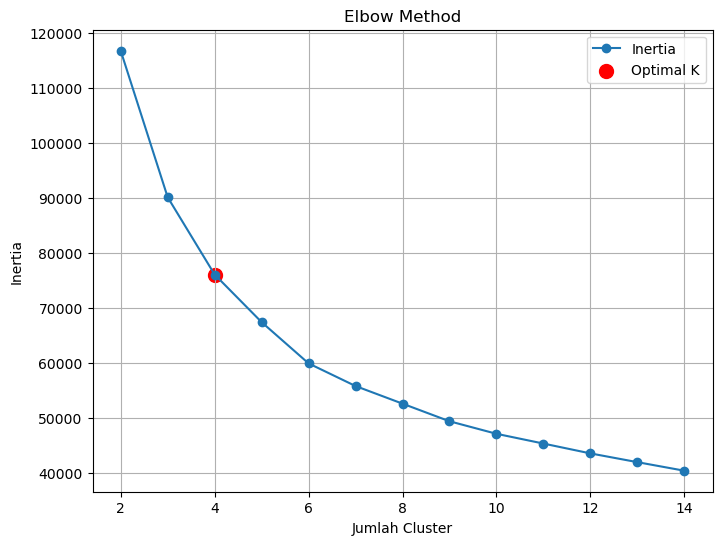

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(2, 15), inertia, marker='o', linestyle='-', label='Inertia')
plt.scatter(4, inertia[2], color='red', s=100, label='Optimal K')
plt.xlabel('Jumlah Cluster')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.legend()
plt.grid()
plt.show()

Jumlah cluster yang optimal sepertinya adalah K=4 atau K=5 karena di titik tersebut penurunan inertia mulai lebih kecil dibandingkan sebelumnya.

In [ ]:
from sklearn.metrics import silhouette_score
range_ = list(range(2, 15))
silhouette_scores = []
display(range_)

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [ ]:
for k in range_:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(df_selected)

    score = silhouette_score(df_selected, cluster_labels, metric='euclidean')
    silhouette_scores.append(score)

In [ ]:
print(silhouette_scores)

[0.48269096013830937, 0.36379066136307053, 0.3754635153112605, 0.2941534811831622, 0.29590481963151294, 0.25613115504761985, 0.2543795331911193, 0.24539875309022374, 0.23855972845957904, 0.22989295577791885, 0.23488787563137423, 0.22633017408263204, 0.22130206188457316]


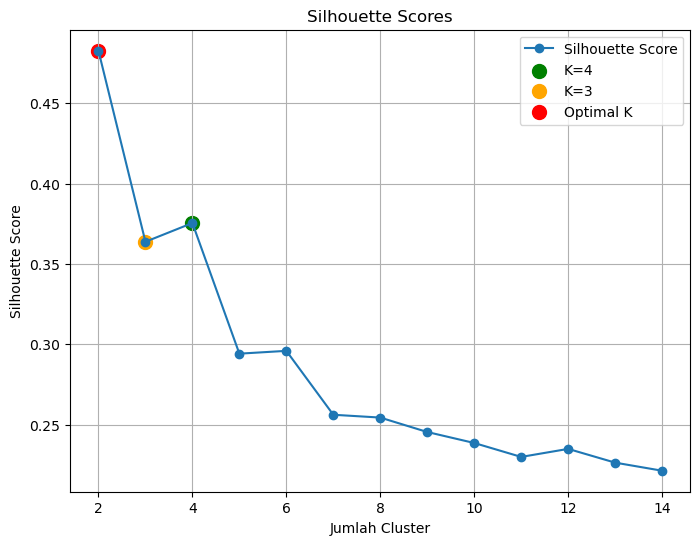

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(2, 15), silhouette_scores, marker='o', linestyle='-', label='Silhouette Score')

plt.scatter(4, silhouette_scores[2], color='green', s=100, label='K=4')
plt.scatter(3, silhouette_scores[1], color='orange', s=100, label='K=3')

best_k = range_[silhouette_scores.index(max(silhouette_scores))]
best_score = max(silhouette_scores)
plt.scatter(best_k, best_score, color='red', s=100, label='Optimal K')

plt.xlabel('Jumlah Cluster')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores')
plt.legend()
plt.grid()

ketika score mendekati 1 adalah yg terbaik. score : -1 sampai 1

K=2 → 0.482 memiliki Optimal K (tertinggi). Namun dengan mempertimbangkan keseimbangan antara pemisahan yang baik dan jumlah segmen yang cukup, K=4 mungkin menjadi pilihan terbaik.

### Visualisasi Clustering

In [ ]:
df_selected = df_scaled.copy()

In [ ]:
# K-Means Clustering
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(df_selected)

KMeans(n_clusters=4, random_state=42)

In [ ]:
df_selected['cluster'] = kmeans.labels_

In [ ]:
df_selected.head()

,FLIGHT_COUNT,BP_SUM,SEG_KM_SUM,SUM_YR_1,SUM_YR_2,Points_Sum,cluster
0,1.281190,3.317521,2.584523,2.905019,2.712076,3.000911,2
1,0.866489,2.725274,2.978143,1.232512,2.882776,2.445576,2
2,2.110591,3.127626,2.966097,-0.820855,0.194350,2.822851,2
3,1.281190,3.322087,2.974725,2.691210,2.690690,3.005193,2
4,1.488540,3.109362,1.856373,2.627267,2.886275,2.805725,2


In [ ]:
# Lakukan PCA untuk Reduksi Dimensi ke 2D agar Bisa Diuji Visualisasi
pca_2d = PCA(n_components=2)
df_pca_2d = pca_2d.fit_transform(df_selected.drop(columns=['cluster']))

# Masukkan hasil PCA ke dalam DataFrame
df_pca_2d = pd.DataFrame(df_pca_2d, columns=['PC1', 'PC2'])
df_pca_2d['cluster'] = df_selected['cluster']

In [ ]:
df_pca_2d.head()

,PC1,PC2,cluster
0,6.389499,0.342905,2
1,5.401795,-1.019368,2
2,4.694304,-0.754027,2
3,6.491676,0.194653,2
4,5.944445,0.021523,2


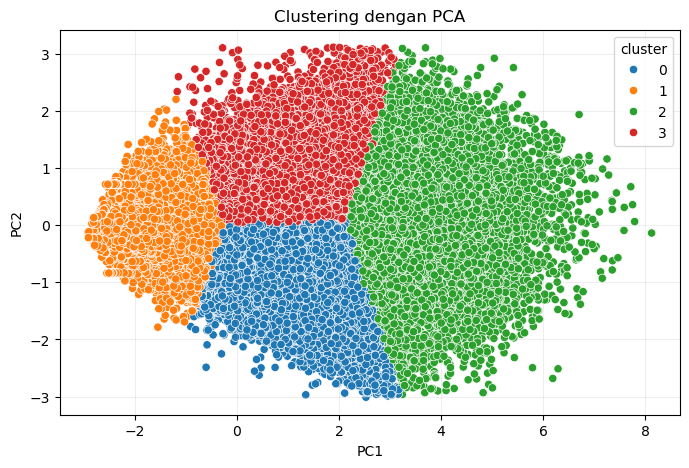

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_pca_2d, x='PC1', y='PC2', hue='cluster', palette='tab10')
plt.title('Clustering dengan PCA')
plt.grid(True, which='both', linewidth=0.5, alpha=0.3)
plt.show()


 ### Interpretasi Model dan Hasil

In [ ]:
# Statistik untuk setiap cluster
df_summary_kmeans = df_selected.groupby('cluster').agg(['mean', 'std']).reset_index()
display(df_summary_kmeans)

cluster FLIGHT_COUNT              BP_SUM           SEG_KM_SUM            \
                  mean       std      mean       std       mean       std   
0       0     0.317773  0.632751  0.367946  0.543215   0.416250  0.605327   
1       1    -0.680628  0.338485 -0.760405  0.324281  -0.754525  0.362240   
2       2     1.699879  0.950656  1.777644  0.649611   1.690259  0.633627   
3       3     0.254498  0.636653  0.370983  0.522456   0.373793  0.608464   

   SUM_YR_1            SUM_YR_2           Points_Sum            
       mean       std      mean       std       mean       std  
0 -0.489829  0.518185  0.963152  0.724816   0.395797  0.614134  
1 -0.531299  0.494570 -0.570481  0.468264  -0.741183  0.419182  
2  1.252730  1.007180  1.329748  0.952569   1.679745  0.625053  
3  1.058270  0.703391 -0.461662  0.501133   0.365293  0.590606

**Berdasarkan Fitur Asli**:<br>
✔ Cluster 0: Pengeluaran rendah, sedikit penerbangan, jarak ditempuh rendah, poin terkumpul rendah, serta pengumpulan poin tahunan rendah.<br>
✔ Cluster 1: Pengeluaran sangat rendah, sedikit penerbangan, jarak ditempuh rendah, poin terkumpul sangat rendah, serta pengumpulan poin tahunan sangat rendah.<br>
✔ Cluster 2: Pengeluaran sangat tinggi, lebih banyak penerbangan, jarak ditempuh sangat tinggi, dan poin terkumpul sangat tinggi, serta pengumpulan poin tahunan sangat tinggi.<br>
✔ Cluster 3: Pengeluaran moderat, banyak penerbangan, jarak ditempuh tinggi, dan poin terkumpul tinggi, serta pengumpulan poin tahunan tinggi.<br>

In [ ]:
df_pca_2d.groupby(['cluster']).agg({
    'PC1': ['mean', 'std'],
    'PC2': ['mean', 'std']
})

PC1                 PC2          
             mean       std      mean       std
cluster                                        
0        0.839677  0.908732 -1.012127  0.669074
1       -1.663434  0.615660 -0.005826  0.595171
2        3.880640  1.035243  0.023383  1.169696
3        0.780621  0.896766  1.092582  0.674411

**Berdasarkan PCA**:
- Cluster 0 → PC1 positif & PC2 negatif → Ini berarti mereka memiliki pengeluaran moderat dengan jarak perjalanan rendah.
- Cluster 1 → PC1 negatif & PC2 netral → Ini berarti mereka adalah grup dengan pengeluaran & perjalanan paling rendah.
- Cluster 2 → PC1 sangat positif & PC2 hampir netral → Ini menunjukkan bahwa mereka memiliki pengeluaran dan perjalanan paling tinggi.
- Cluster 3 → PC1 positif & PC2 positif → Ini berarti mereka cukup aktif dalam pengeluaran dan perjalanan tetapi tidak setinggi Cluster 2.

In [ ]:
#import scipy.cluster.hierarchy as shc
#plt.figure(figsize=(10, 7))
#plt.title("Dendrograms")
#dend = shc.dendrogram(shc.linkage(df_selected, method='ward'))

## `MODEL EVALUATION`

Evaluasi model dilakukan dengan membandingkan hasil clustering antara metode K-Means dan Agglomerative Clustering. Silhouette Score digunakan untuk menilai seberapa baik objek dalam satu cluster lebih mirip dengan objek di cluster yang sama dibandingkan dengan cluster lain.

In [ ]:
# Agglomerative Clustering
from sklearn.cluster import AgglomerativeClustering

agg_clustering = AgglomerativeClustering(n_clusters=4)
agg_clustering.fit(df_selected.drop(columns=['cluster']))

AgglomerativeClustering(n_clusters=4)

In [ ]:
df_selected['cluster_ac'] = agg_clustering.labels_

In [ ]:
df_selected.head()

,FLIGHT_COUNT,BP_SUM,SEG_KM_SUM,SUM_YR_1,SUM_YR_2,Points_Sum,cluster,cluster_ac
0,1.281190,3.317521,2.584523,2.905019,2.712076,3.000911,2,0
1,0.866489,2.725274,2.978143,1.232512,2.882776,2.445576,2,0
2,2.110591,3.127626,2.966097,-0.820855,0.194350,2.822851,2,0
3,1.281190,3.322087,2.974725,2.691210,2.690690,3.005193,2,0
4,1.488540,3.109362,1.856373,2.627267,2.886275,2.805725,2,0


In [ ]:
df_pca_2d['cluster_ac'] = df_selected['cluster_ac']

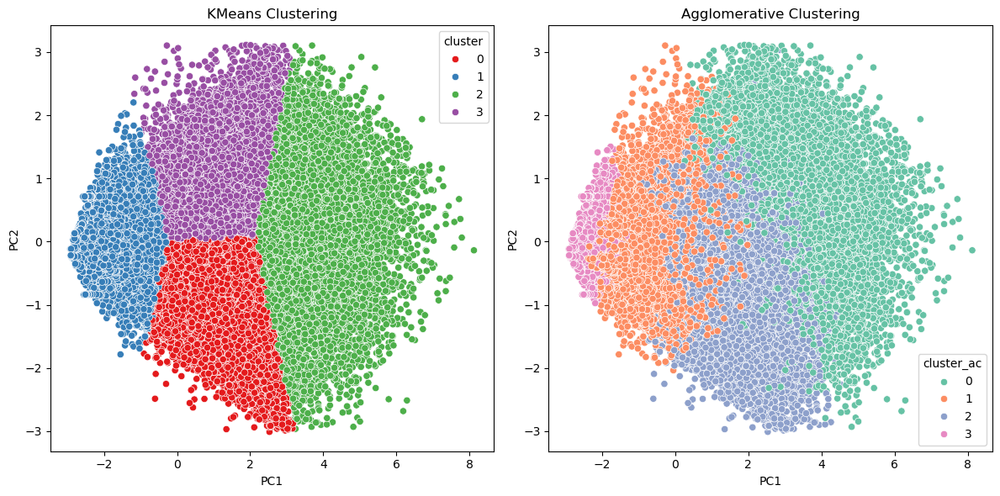

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.scatterplot(data=df_pca_2d, x='PC1', y='PC2', hue='cluster', palette='Set1', marker='o', ax=ax[0])
ax[0].set_title('KMeans Clustering')
sns.scatterplot(data=df_pca_2d, x='PC1', y='PC2', hue='cluster_ac', palette='Set2', marker='o', ax=ax[1])
ax[1].set_title('Agglomerative Clustering')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
silhouette_kmeans = silhouette_score(df_selected.drop(columns=['cluster', 'cluster_ac']), df_selected['cluster'])
silhouette_agglo = silhouette_score(df_selected.drop(columns=['cluster', 'cluster_ac']), df_selected['cluster_ac'])

Nilai mendekati 1 berarti cluster terpisah dengan baik, sedangkan nilai mendekati -1 berarti cluster tidak terbentuk dengan baik.

In [ ]:
silhouette_scores = pd.DataFrame({
    'Model': ['K-Means', 'Agglomerative Clustering'],
    'Silhouette Score': [silhouette_kmeans, silhouette_agglo]
})

display(silhouette_scores)

,Model,Silhouette Score
0,K-Means,0.375464
1,Agglomerative Clustering,0.188709


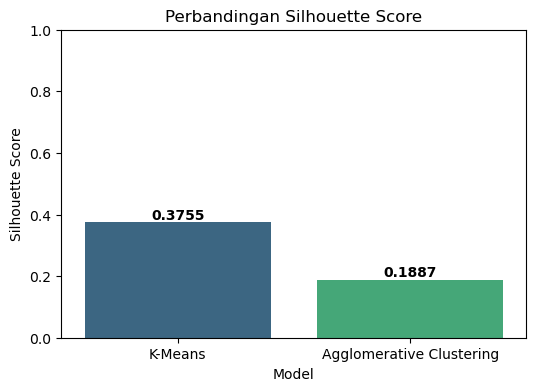

In [ ]:
plt.figure(figsize=(6, 4))
ax = sns.barplot(x='Model', y='Silhouette Score', data=silhouette_scores, palette='viridis')
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.ylim(0, 1)
plt.title('Perbandingan Silhouette Score')
plt.show()

 ### Interpretasi Model Evaluasi dan Hasil

In [ ]:
df_summary_kmeans = df_selected.groupby('cluster').agg(['mean', 'std']).reset_index()
display(df_summary_kmeans)

cluster FLIGHT_COUNT              BP_SUM           SEG_KM_SUM            \
                  mean       std      mean       std       mean       std   
0       0     0.317773  0.632751  0.367946  0.543215   0.416250  0.605327   
1       1    -0.680628  0.338485 -0.760405  0.324281  -0.754525  0.362240   
2       2     1.699879  0.950656  1.777644  0.649611   1.690259  0.633627   
3       3     0.254498  0.636653  0.370983  0.522456   0.373793  0.608464   

   SUM_YR_1            SUM_YR_2           Points_Sum           cluster_ac  \
       mean       std      mean       std       mean       std       mean   
0 -0.489829  0.518185  0.963152  0.724816   0.395797  0.614134   1.763909   
1 -0.531299  0.494570 -0.570481  0.468264  -0.741183  0.419182   2.004006   
2  1.252730  1.007180  1.329748  0.952569   1.679745  0.625053   0.649665   
3  1.058270  0.703391 -0.461662  0.501133   0.365293  0.590606   1.198606   

             
        std  
0  0.429634  
1  0.997939  
2  0.936613  
3  0.769061

In [ ]:
df_summary_ac = df_selected.groupby('cluster_ac').agg(['mean', 'std']).reset_index()
display(df_summary_ac)

cluster_ac FLIGHT_COUNT              BP_SUM           SEG_KM_SUM            \
                     mean       std      mean       std       mean       std   
0          0     1.611258  1.054789  1.630345  0.783902   1.514353  0.760529   
1          1    -0.381665  0.413226 -0.392612  0.383308  -0.381772  0.420884   
2          2     0.536559  0.686088  0.650819  0.613920   0.692727  0.696969   
3          3    -0.866034  0.190594 -0.978837  0.191642  -0.976299  0.226975   

   SUM_YR_1            SUM_YR_2           Points_Sum             cluster  \
       mean       std      mean       std       mean       std      mean   
0  1.714012  0.854723  0.730382  1.185419   1.525926  0.757544  2.272045   
1 -0.251045  0.771184 -0.320049  0.577162  -0.320888  0.567489  1.234233   
2  0.044554  0.757093  0.835120  0.932115   0.622566  0.628272  1.177025   
3 -0.595828  0.400233 -0.797133  0.284971  -0.995843  0.205359  1.000000   

             
        std  
0  0.464370  
1  0.880329  
2  1.332994  
3  0.000000

| **Cluster** | **Fitur Dominan** | **K-Means Cluster** | **Agglomerative Clustering (AC)** | **Kesimpulan** |  
|------------|-----------------|----------------------|----------------------------------|--------------|  
| **0** | SUM_YR_2, Points_Sum, SEG_KM_SUM | Pengeluaran tahun terakhir sedang, poin sedang, dan jarak perjalanan sedang. | Pengeluaran meningkat, poin lebih tinggi, dan jarak perjalanan lebih jauh. | K-Means mengelompokkan ke dalam kategori aktivitas rendah, sementara AC menunjukkan adanya peningkatan aktivitas. |  
| **1** | FLIGHT_COUNT, BP_SUM, SEG_KM_SUM | Aktivitas penerbangan dan pengeluaran sangat rendah. | Aktivitas penerbangan tetap rendah tetapi lebih bervariasi. | AC dan K-Means sama-sama menunjukkan aktivitas rendah, dengan AC memberikan sedikit variasi dalam intensitas aktivitas. |  
| **2** | BP_SUM, SEG_KM_SUM, Points_Sum | Pengeluaran, perjalanan, dan poin tertinggi. | Pengeluaran tinggi tetapi lebih merata, perjalanan masih dominan. | AC meratakan distribusi pelanggan dengan perjalanan tinggi, sementara K-Means cenderung mengelompokkan pelanggan dengan aktivitas ekstrem. |  
| **3** | FLIGHT_COUNT, SUM_YR_1, SUM_YR_2 | Aktivitas penerbangan dan pengeluaran moderat. | Aktivitas dan pengeluaran paling rendah. |  K-Means mengelompokkan ke dalam kategori aktivitas menengah, sementara AC mendefinisikan ulang sebagai kelompok dengan aktivitas paling rendah. |  

**Observasi**<br>

K-Means lebih agresif dalam memisahkan pelanggan dengan perbedaan ekstrim, terutama dalam mengelompokkan pelanggan dengan pengeluaran dan perjalanan sangat tinggi (Cluster 2).
Agglomerative Clustering lebih konservatif dan cenderung meratakan distribusi pelanggan, sehingga nilai rata-rata dalam setiap cluster tidak terlalu ekstrem.

- K-Means → Segmentasi yang lebih tajam dan jelas.
- Agglomerative Clustering → Segmentasi yang lebih alami tanpa pemisahan ekstrem.

In [ ]:
df_pca_2d.groupby(['cluster']).agg({
    'PC1': ['mean', 'std'],
    'PC2': ['mean', 'std']
})

PC1                 PC2          
             mean       std      mean       std
cluster                                        
0        0.839677  0.908732 -1.012127  0.669074
1       -1.663434  0.615660 -0.005826  0.595171
2        3.880640  1.035243  0.023383  1.169696
3        0.780621  0.896766  1.092582  0.674411

In [ ]:
df_pca_2d.groupby(['cluster_ac']).agg({
    'PC1': ['mean', 'std'],
    'PC2': ['mean', 'std']
})

PC1                 PC2          
                mean       std      mean       std
cluster_ac                                        
0           3.568960  1.429922  0.768122  1.192705
1          -0.842337  0.672031  0.031670  0.876431
2           1.409684  1.080581 -0.531581  0.996460
3          -2.151415  0.332975  0.099853  0.446247

| Cluster | K-Means cluster (PC1, PC2)                         | Agglomerative Clustering (PC1, PC2) | Kesimpulan |
|---------|--------------------------------|---------------------------------|-------------|
| **0**   | PC1 positif, PC2 negatif → Pengeluaran moderat, perjalanan rendah. | PC1 sangat positif, PC2 positif → Aktivitas dan pengeluaran tinggi. | AC mengelompokkan pelanggan ini ke segmen yang lebih aktif dibandingkan K-Means. |
| **1**   | PC1 sangat negatif, PC2 netral → Aktivitas dan pengeluaran paling rendah. | PC1 negatif, PC2 netral → Masih rendah, tetapi lebih bervariasi. | AC tetap mengelompokkan pelanggan ini sebagai yang paling pasif, tetapi dengan sedikit variasi. |
| **2**   | PC1 sangat positif, PC2 netral → Pengeluaran & perjalanan tertinggi. | PC1 moderat, PC2 negatif → Masih tinggi, tetapi tidak seekstrem K-Means. | AC membuat distribusi pelanggan dengan perjalanan tinggi lebih merata dibandingkan K-Means. |
| **3**   | PC1 positif, PC2 positif → Aktivitas dan pengeluaran cukup tinggi. | PC1 sangat negatif, PC2 netral → Aktivitas dan pengeluaran paling rendah. | AC mendefinisikan ulang cluster ini sebagai kelompok dengan aktivitas paling sedikit. |


**Observasi**<br>
- K-Means menghasilkan segmen yang lebih tajam dan ekstrem dalam pemisahan pelanggan.
- AC lebih moderat dan meratakan distribusi pelanggan dalam setiap cluster.
- Perbedaan terbesar ada di Cluster 3, yang di K-Means termasuk kelompok aktif, tetapi di AC justru menjadi yang paling pasif.

| Model                     | Silhouette Score |
|---------------------------|------------------|
| K-Means                   | 0.375464         |
| Agglomerative Clustering  | 0.188709         |


**Observasi**<br>
- K-Means lebih baik dalam membentuk klaster dengan pemisahan yang lebih jelas.
- Agglomerative Clustering memiliki skor lebih rendah, menunjukkan klaster yang lebih bercampur.<br>

Model `K-Means Clustering` ini lebih baik dalam menghasilkan segmentasi yang lebih tegas dan terpisah, memungkinkan perusahaan untuk merancang strategi pemasaran yang lebih efektif dan tertarget.

## `INSIGHT & RECOMMENDATION`

| **Cluster** | **Fitur Dominan**                         | **Karakteristik K-Means**                                              | **Rekomendasi Bisnis**                                                 |
|-------------|-------------------------------------------|----------------------------------------------------------------------|------------------------------------------------------------------------|
| **0**       | SUM_YR_2, Points_Sum, SEG_KM_SUM         | Pengeluaran tahun terakhir sedang, poin sedang, dan jarak perjalanan sedang. | Berikan promosi atau diskon khusus untuk meningkatkan aktivitas pelanggan. |
| **1**       | FLIGHT_COUNT, BP_SUM, SEG_KM_SUM         | Aktivitas penerbangan dan pengeluaran sangat rendah.                  | Kirimkan kampanye pemasaran yang lebih personal untuk menarik keterlibatan pelanggan. |
| **2**       | BP_SUM, SEG_KM_SUM, Points_Sum          | Pengeluaran tinggi, perjalanan dominan, dan poin tertinggi.           | Fokus pada program loyalitas dan penawaran eksklusif untuk mempertahankan pelanggan ini. |
| **3**       | FLIGHT_COUNT, SUM_YR_1, SUM_YR_2         | Aktivitas penerbangan dan pengeluaran moderat.                         | Berikan insentif untuk meningkatkan engagement, seperti upgrade layanan atau bonus poin. |
